## Last Edited on

In [19]:
import sys
from datetime import datetime

# Print the current system date and time
print("Notebook run date:", datetime.now().strftime("%Y-%m-%d %H:%M:%S"))

Notebook run date: 2025-07-29 14:22:31


# Final Code File

## Importing The data 

In [20]:
import pandas as pd
import plotly.express as px
from shapely.geometry import Point, Polygon
from pyproj import crs
import geopandas as gpd
import matplotlib.pyplot as plt
import folium
from folium.plugins import MarkerCluster 
import contextily as cx


Downloaded from "https://data.cityofchicago.org/Community-Economic-Development/City-Owned-Land-Inventory/aksk-kvfp/about_data"

In [21]:
df=pd.read_csv('/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/Data/City-Owned_Land_Inventory_20250207.csv')

In [22]:
df.describe()

,ID,Sq. Ft.,Square Footage - City Estimate,Land Value (2022),Ward,Community Area Number,Zip Code,X Coordinate,Y Coordinate,Latitude,Longitude
count,20574.000000,1.939000e+04,4198.000000,4.277000e+03,17947.000000,17947.000000,19387.000000,1.794700e+04,1.794700e+04,17947.000000,17947.000000
mean,35232.695101,1.802271e+03,5079.615660,5.121154e+04,18.179584,45.657993,49925.761593,1.168659e+06,1.872762e+06,41.806371,-87.656976
std,20337.721629,7.464811e+04,19235.317621,3.733608e+05,9.240090,17.850046,23114.877729,1.360663e+04,2.435525e+04,0.067035,0.049429
min,108.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,1.119442e+06,1.814208e+06,41.645437,-87.836143
25%,18156.500000,0.000000e+00,2988.000000,9.281000e+03,10.000000,29.000000,60609.000000,1.157521e+06,1.859142e+06,41.768851,-87.697097
50%,34245.500000,0.000000e+00,3122.000000,1.210200e+04,19.000000,43.000000,60621.000000,1.170108e+06,1.869668e+06,41.797810,-87.651788
75%,58843.750000,0.000000e+00,3916.250000,2.029700e+04,24.000000,67.000000,60630.000000,1.177195e+06,1.894302e+06,41.865791,-87.625732
max,69798.000000,1.021020e+07,703517.000000,1.275000e+07,50.000000,77.000000,60827.000000,1.203321e+06,1.951596e+06,42.022831,-87.531304


In [9]:
non_na_summary = df.count()
print(non_na_summary)

ID                                20574
PIN                               20574
Address                           18037
Managing Organization              8902
Property Status                   20540
Date of Acquisition               10877
Date of Disposition                3772
Sales Status                       9082
Sale Offering Status                488
Sale Offering Reason                489
Sq. Ft.                           19390
Square Footage - City Estimate     4198
Land Value (2022)                  4277
Ward                              17947
Community Area Number             17947
Community Area Name               17944
Zoning Classification             17944
Zip Code                          19387
Last Update                       20574
Application Use                     525
Grouped Parcels                     311
Application Deadline                808
Offer Round                         815
Application URL                     713
X Coordinate                      17947


### Removing the hyphens from pin and Make a list of all pins from data

In [23]:
## Exploratory analysis. # pin removed and 
df.rename(columns={'PIN':'pin'}, inplace=True)
df['pin'] = df['pin'].str.replace('-', '', regex=True)  # Remove hyphens
pin_values = df['pin'].unique().tolist()  # Get unique PINs

### Upload the Chicago City Shapefile to the environment 

In [24]:
city_shape= gpd.read_file('/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/Data/Chicago_City_Limits-shp/Chicago_City_Limits.shp')

### Now importing the API Data using the unique pins

In [25]:
from sodapy import Socrata

# Initialize Socrata client
client = Socrata("datacatalog.cookcountyil.gov", None)

# Ensure 'pin' column is formatted correctly in df

# API allows a limited number of conditions in the 'where' clause, so we batch the requests
chunk_size = 100  # Adjust this based on API limits
filtered_results = []

for i in range(0, len(pin_values), chunk_size):
    pin_chunk = pin_values[i:i + chunk_size]

    # Format where clause dynamically using 'IN' instead of 'OR' for better API compatibility
    pin_filter = " OR ".join([f"pin='{p}'" for p in pin_chunk]) 

    try:
        results = client.get("nj4t-kc8j", where=pin_filter, limit=50000)  # Adjust limit as needed

        if results:
            filtered_results.append(pd.DataFrame.from_records(results))

        print(f"Fetched {i + len(pin_chunk)} records...")
    
    except Exception as e:
        print(f"Error fetching batch {i}-{i+chunk_size}: {e}")

# Combine all fetched data into a single DataFrame
if filtered_results:
    results_df = pd.concat(filtered_results, ignore_index=True)
else:
    results_df = pd.DataFrame()  # Empty if no results

# Ensure 'pin' is the same format in both DataFrames before merging
if not results_df.empty:
    results_df['pin'] = results_df['pin'].astype(str)

# Merge df (original data) with results_df (API data), adding columns instead of rows
merged_df = df.merge(results_df, on='pin', how='inner')

# Display the merged DataFrame
print(merged_df)

Fetched 100 records...
Fetched 200 records...
Fetched 300 records...
Fetched 400 records...
Fetched 500 records...
Fetched 600 records...
Fetched 700 records...
Fetched 800 records...
Fetched 900 records...
Fetched 1000 records...
Fetched 1100 records...
Fetched 1200 records...
Fetched 1300 records...
Fetched 1400 records...
Fetched 1500 records...
Fetched 1600 records...
Fetched 1700 records...
Fetched 1800 records...
Fetched 1900 records...
Fetched 2000 records...
Fetched 2100 records...
Fetched 2200 records...
Fetched 2300 records...
Fetched 2400 records...
Fetched 2500 records...
Fetched 2600 records...
Fetched 2700 records...
Fetched 2800 records...
Fetched 2900 records...
Fetched 3000 records...
Fetched 3100 records...
Fetched 3200 records...
Fetched 3300 records...
Fetched 3400 records...
Fetched 3500 records...
Fetched 3600 records...
Fetched 3700 records...
Fetched 3800 records...
Fetched 3900 records...
Fetched 4000 records...
Fetched 4100 records...
Fetched 4200 records...
F

In [14]:
merged_df['pin'].value_counts()

pin
25223040080000    27
20294240360000    27
20102110030000    27
17201080040000    27
16233100190000    27
                  ..
17221100230000     2
19172070270000     2
20031100470000     2
20153170420000     2
17173280140000     1
Name: count, Length: 20436, dtype: int64

## Grouping the dataset with pin and year

In [26]:
df_latest = merged_df.loc[merged_df.groupby('pin')['year'].idxmax()]

# Display the final DataFrame
print(df_latest)

           ID             pin               Address Managing Organization  \
266279   7473  10253160220000     7201 N KEDZIE AVE         Park District   
28927   66030  10333250260000     6430 N LEHIGH AVE                   AIS   
404775   7474  10362280400000     2602 W PRATT BLVD                   NaN   
450390   7475  10362280410000     2600 W PRATT BLVD                   NaN   
544997  36361  10363250110000  6444 N FRANCISCO AVE          DPD Planning   
...       ...             ...                   ...                   ...   
318360  59229  26314180390000       3249 E 136TH ST      DPD - Large Lots   
390918  37481  26314200080000      13610 S AVENUE O                   NaN   
32349   37413  26321110050000      13311 S AVENUE N                   NaN   
337782  66476  26323020410000      13458 S AVENUE L                 Other   
222525  37476  26323040080000      13537 S AVENUE O                   NaN   

       Property Status Date of Acquisition Date of Disposition  \
266279  N

### Making summary tables


In [27]:
import pandas as pd
import numpy as np

def create_summary_table(df_latest):
    summary = pd.DataFrame()

    # Numerical variables
    for col in ['Sq. Ft.', 'Square Footage - City Estimate', 'Land Value (2022)', 'Latitude', 'Longitude']:
        summary[col] = df_latest[col].agg(['count', 'mean', 'std', 'min', 'max'])
        summary.loc['25%', col] = df_latest[col].quantile(0.25)
        summary.loc['50%', col] = df_latest[col].quantile(0.50)
        summary.loc['75%', col] =df_latest[col].quantile(0.75)

    # Categorical variables
    for col in ['Property Status', 'Sales Status', 'Ward', 'Community Area Name', 'Zoning Classification']:
        summary[col] = pd.Series({
            'count': df_latest[col].count(),
            'unique': df_latest[col].nunique(),
            'top': df_latest[col].value_counts().index[0],
            'freq': df_latest[col].value_counts().iloc[0]
        })

    # Date variables
    for col in ['Date of Acquisition', 'Date of Disposition']:
        df_latest[col] = pd.to_datetime(df_latest[col], errors='coerce')
        date_stats = df_latest[col].agg(['min', 'max'])
        summary[col] = pd.Series({
            'count': df_latest[col].count(),
            'min': date_stats['min'],
            'max': date_stats['max'],
            'range_days': (date_stats['max'] - date_stats['min']).days
        })

    return summary.T  # Transpose for better readability

# Create and print the summary table
summary_table = create_summary_table(df_latest)
print(summary_table)

# Optionally, save to CSV
summary_table.to_csv('summary_statistics_final.csv')


                                  count          mean            std  \
Sq. Ft.                         19388.0   1802.457087   74651.955681   
Square Footage - City Estimate   4197.0   5080.825957   19237.449722   
Land Value (2022)                4276.0  51215.239935  373404.401149   
Latitude                        17934.0     41.806335       0.067002   
Longitude                       17934.0    -87.656972       0.049413   
Property Status                   20435           NaN            NaN   
Sales Status                       9081           NaN            NaN   
Ward                            17934.0           NaN            NaN   
Community Area Name               17931           NaN            NaN   
Zoning Classification             17931           NaN            NaN   
Date of Acquisition               10836           NaN            NaN   
Date of Disposition                3769           NaN            NaN   

                                                min            

In [28]:
df_latest['Property Status'].value_counts()

Property Status
Owned by City     12299
Sold               5694
Leased             1493
Not City Owned      871
Ownd by City         50
Sold by City         11
Sold By City          9
In Acquisition        8
Name: count, dtype: int64

In [29]:
missing_longitude = df_latest['Longitude'].isna().sum()
missing_latitude = df_latest['Latitude'].isna().sum()

print(f"Missing Longitude values: {missing_longitude}")
print(f"Missing Latitude values: {missing_latitude}")

Missing Longitude values: 2502
Missing Latitude values: 2502


## Mapping Property Status Column

In [31]:
# Define mapping for standardizing property status values
property_status_mapping = {
    "Owned by City": "Owned by City",
    "Ownd by City": "Owned by City",  # Fix typo
    "Sold": "Sold",
    "Sold by City": "Sold",
    "Sold By City": "Sold",  # Fix capitalization
    "Leased": "Leased",
    "Not City Owned": "Not City Owned",
    "In Acquisition": "In Acquisition"
}


### The Standardized Property Status col

In [33]:
df_latest["Property Status"] = df_latest["Property Status"].replace(property_status_mapping)

# Verify the unique values after mapping
print(df_latest["Property Status"].value_counts())

Property Status
Owned by City     12349
Sold               5714
Leased             1493
Not City Owned      871
In Acquisition        8
Name: count, dtype: int64


In [35]:
df_latest_cleaned = df_latest.dropna(subset=['Longitude', 'Latitude'])

# Display the cleaned DataFrame
# print(df_latest_cleaned)

In [36]:
df_latest_cleaned.to_csv('/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/Data/assessment_and_city_owned_new_data.csv')

## Getting Assessor's Values Data from API 

In [37]:

from sodapy import Socrata

# Initialize Socrata client
client = Socrata("datacatalog.cookcountyil.gov", None)

# Ensure 'pin' column is formatted correctly in df

# API allows a limited number of conditions in the 'where' clause, so we batch the requests
chunk_size = 100  # Adjust this based on API limits
filtered_results = []

for i in range(0, len(pin_values), chunk_size):
    pin_chunk = pin_values[i:i + chunk_size]

    # Format where clause dynamically using 'IN' instead of 'OR' for better API compatibility
    pin_filter = " OR ".join([f"pin='{p}'" for p in pin_chunk]) 

    try:
        results = client.get("uzyt-m557", where=pin_filter, limit=50000)  # Adjust limit as needed

        if results:
            filtered_results.append(pd.DataFrame.from_records(results))

        print(f"Fetched {i + len(pin_chunk)} records...")
    
    except Exception as e:
        print(f"Error fetching batch {i}-{i+chunk_size}: {e}")

# Combine all fetched data into a single DataFrame
if filtered_results:
    results_df = pd.concat(filtered_results, ignore_index=True)
else:
    results_df = pd.DataFrame()  # Empty if no results

# Ensure 'pin' is the same format in both DataFrames before merging
if not results_df.empty:
    results_df['pin'] = results_df['pin'].astype(str)

# Merge df (original data) with results_df (API data), adding columns instead of rows
merged_assess = df_latest_cleaned.merge(results_df, on='pin', how='inner')

# Display the merged DataFrame
print(merged_assess)

Fetched 100 records...
Fetched 200 records...
Fetched 300 records...
Fetched 400 records...
Fetched 500 records...
Error fetching batch 500-600: HTTPSConnectionPool(host='datacatalog.cookcountyil.gov', port=443): Read timed out. (read timeout=10)
Fetched 700 records...
Fetched 800 records...
Fetched 900 records...
Fetched 1000 records...
Fetched 1100 records...
Fetched 1200 records...
Error fetching batch 1200-1300: HTTPSConnectionPool(host='datacatalog.cookcountyil.gov', port=443): Read timed out. (read timeout=10)
Fetched 1400 records...
Error fetching batch 1400-1500: HTTPSConnectionPool(host='datacatalog.cookcountyil.gov', port=443): Read timed out. (read timeout=10)
Fetched 1600 records...
Fetched 1700 records...
Fetched 1800 records...
Fetched 1900 records...
Fetched 2000 records...
Fetched 2100 records...
Fetched 2200 records...
Error fetching batch 2200-2300: HTTPSConnectionPool(host='datacatalog.cookcountyil.gov', port=443): Read timed out. (read timeout=10)
Fetched 2400 recor

In [38]:
unique_years = results_df['year'].unique()
print(unique_years)

['2024' '2025' '1999' '2000' '2001' '2002' '2003' '2004' '2005' '2006'
 '2007' '2008' '2009' '2010' '2011' '2012' '2013' '2014' '2015' '2016'
 '2017' '2018' '2019' '2020' '2021' '2022' '2023']


In [39]:
results_df['year'] = results_df['year'].astype(int)

In [40]:
results_df_2022 = results_df[results_df['year'] == 2022]

In [41]:
results_df_2022['pin'] = results_df_2022['pin'].astype('Int64')

/var/folders/9c/cqhq_9tn7xg260y42gb15wym0000gn/T/ipykernel_85414/2982695272.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  results_df_2022['pin'] = results_df_2022['pin'].astype('Int64')


In [42]:
type(pin_values[2:])

list

In [43]:
df_latest_cleaned['pin'] = df_latest_cleaned['pin'].astype(int)

/var/folders/9c/cqhq_9tn7xg260y42gb15wym0000gn/T/ipykernel_85414/2165317518.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_latest_cleaned['pin'] = df_latest_cleaned['pin'].astype(int)


In [44]:
df_latest_cleaned.head()

,ID,pin,Address,Managing Organization,Property Status,Date of Acquisition,Date of Disposition,Sales Status,Sale Offering Status,Sale Offering Reason,...,econ_industrial_growth_zone_num,econ_industrial_growth_zone_data_year,econ_enterprise_zone_num,econ_enterprise_zone_data_year,econ_central_business_district_num,econ_central_business_district_data_year,census_school_district_elementary_geoid,census_school_district_secondary_geoid,census_acs5_school_district_elementary_geoid,census_acs5_school_district_secondary_geoid
266279,7473,10253160220000,7201 N KEDZIE AVE,Park District,Not City Owned,1973-12-14,NaT,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
28927,66030,10333250260000,6430 N LEHIGH AVE,AIS,Owned by City,NaT,NaT,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
404775,7474,10362280400000,2602 W PRATT BLVD,NaN,Owned by City,2001-02-13,NaT,Interest,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
450390,7475,10362280410000,2600 W PRATT BLVD,NaN,Owned by City,2001-02-13,NaT,Interest,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
544997,36361,10363250110000,6444 N FRANCISCO AVE,DPD Planning,Owned by City,2015-01-20,NaT,Application Closed,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [45]:
import re
non_numeric_pins = [pin for pin in pin_values if not pin.isdigit()]
print("Non-numeric PINs:", non_numeric_pins)
pin_values_cleaned = [int(re.sub(r'\D', '', pin)) for pin in pin_values]

Non-numeric PINs: ['2019411002/003', '2015304010/011']


In [46]:
df_latest_cleaned.describe()

,ID,pin,Date of Acquisition,Date of Disposition,Sq. Ft.,Square Footage - City Estimate,Land Value (2022),Ward,Community Area Number,Zip Code,X Coordinate,Y Coordinate,Latitude,Longitude
count,17934.000000,1.793400e+04,9169,3151,1.772200e+04,4181.000000,4.260000e+03,17934.000000,17934.000000,17721.000000,1.793400e+04,1.793400e+04,17934.000000,17934.000000
mean,34376.616650,1.946819e+13,1997-10-03 13:17:30.278110848,2014-03-23 19:39:58.095842816,1.930827e+03,4914.386750,4.935403e+04,18.174417,45.669957,54355.872581,1.168660e+06,1.872748e+06,41.806335,-87.656972
min,108.000000,1.025316e+13,1872-12-11 00:00:00,1978-06-06 00:00:00,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,1.119442e+06,1.814208e+06,41.645437,-87.836143
25%,17079.750000,1.623320e+13,1993-04-27 00:00:00,2008-10-30 00:00:00,0.000000e+00,2988.000000,9.279750e+03,10.000000,29.000000,60612.000000,1.157523e+06,1.859142e+06,41.768839,-87.697085
50%,34332.500000,2.009308e+13,2000-02-10 00:00:00,2017-11-14 00:00:00,0.000000e+00,3122.000000,1.202650e+04,19.000000,43.000000,60621.000000,1.170109e+06,1.869657e+06,41.797779,-87.651787
75%,58517.750000,2.022206e+13,2004-12-29 00:00:00,2019-01-16 12:00:00,0.000000e+00,3911.000000,2.026300e+04,24.000000,67.000000,60636.000000,1.177195e+06,1.894289e+06,41.865723,-87.625733
max,69798.000000,2.632304e+13,2029-03-12 00:00:00,2025-01-16 00:00:00,1.021020e+07,703517.000000,1.275000e+07,50.000000,77.000000,60827.000000,1.203321e+06,1.951596e+06,42.022831,-87.531304
std,20065.477804,3.128688e+12,NaN,NaN,7.806854e+04,18474.762813,3.709483e+05,9.232211,17.844379,18463.141548,1.360235e+04,2.434315e+04,0.067002,0.049413


### Keep only Rows with valid pins from pin_values_cleaned 

In [47]:
df_latest_cleaned = df_latest_cleaned[df_latest_cleaned['pin'].isin(pin_values_cleaned)]
results_df_2022 = results_df_2022[results_df_2022['pin'].isin(pin_values_cleaned)]

##### Merged and Exported 

In [48]:
assessment_city_owned = df_latest_cleaned.merge(results_df_2022, on='pin', how='left', suffixes=('_old', '_new'))

In [49]:
assessment_city_owned.to_csv('/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/new_assessment/assessment_and_city_owned_new_data.csv')

## Assessors and cleaned city inventory analysis

## Importing the previously exported data 

In [51]:
df=pd.read_csv('/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/new_assessment/assessment_and_city_owned_new_data.csv')

/var/folders/9c/cqhq_9tn7xg260y42gb15wym0000gn/T/ipykernel_85414/3971055528.py:1: DtypeWarning: Columns (118,131) have mixed types. Specify dtype option on import or set low_memory=False.
  df=pd.read_csv('/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/new_assessment/assessment_and_city_owned_new_data.csv')


In [52]:
df.shape

(17934, 160)

In [53]:
df['Property Status'].value_counts()

Property Status
Owned by City     11625
Sold               5318
Not City Owned      820
Leased              164
In Acquisition        7
Name: count, dtype: int64

In [54]:
df[['Longitude', 'Latitude']].isna().sum()

Longitude    0
Latitude     0
dtype: int64

## Plotting Folium

In [102]:
crs = "EPSG:4326"
# zip x and y coordinates into single feature
geometry = [Point(xy) for xy in zip(df_latest_cleaned['Longitude'], df_latest_cleaned['Latitude'])]
# create GeoPandas dataframe
geo_df = gpd.GeoDataFrame(df_latest_cleaned,
 crs = crs,
 geometry = geometry)

In [103]:
m = folium.Map(location=[41.881832, -87.623177], zoom_start=10, control_scale=True)


In [104]:
from branca.element import Template, MacroElement

class ColorLegend(MacroElement):
    def __init__(self, colors):
        super(ColorLegend, self).__init__()
        self._template = Template("""
        {% macro html(this, kwargs) %}
        <div style="position: fixed; bottom: 50px; left: 50px; width: 200px; 
                    border:2px solid grey; z-index:9999; font-size:12px; background-color:white;">
            <div style="position: relative; top: 3px; left: 3px; padding: 5px;">
            <p style="margin: 0; padding: 0;"><strong>Property Status</strong></p>
            {% for item in this.colors %}
            <p style="margin: 0; padding: 0;">
                <i class="fa fa-circle fa-1x" style="color:{{item[1]}}"></i> {{item[0]}}
            </p>
            {% endfor %}
            </div>
        </div>
        {% endmacro %}
        """)
        self.colors = colors

# Define the color mapping
color_mapping = {
    'Owned by City': '#1f77b4',
    'Sold': '#ff7f0e',
    'Leased': '#2ca02c',
    'Not City Owned': '#9467bd',
    'In Acquisition': '#bcbd22',
}

### Map with Property Status, bus, rail routes

In [105]:
import folium
import geopandas as gpd
from folium.plugins import MarkerCluster

# Initialize the folium map
m = folium.Map(location=[41.881832, -87.623177], zoom_start=10, control_scale=True)

# Marker cluster for property status markers
marker_cluster = MarkerCluster().add_to(m)

def get_color(status):
    return color_mapping.get(status, '#000000')  

# Add markers for properties
for idx, row in geo_df.iterrows():
    if not row.geometry.is_empty:
        folium.CircleMarker(
            location=[row.geometry.y, row.geometry.x],
            radius=5,
            popup=f"Property Status: {row['Property Status']}",
            color=get_color(row['Property Status']),
            fill=True,
            fillColor=get_color(row['Property Status']),
            fillOpacity=0.7
        ).add_to(marker_cluster)

# Load and add city boundaries
city_shape = gpd.read_file("/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/Data/Chicago_City_Limits-shp/Chicago_City_Limits.shp").to_crs(epsg=4326)
folium.GeoJson(
    city_shape,
    name="City Boundary",
    style_function=lambda x: {'fillColor': 'pink', 'color': 'pink', 'weight': 1, 'fillOpacity': 0.4}
).add_to(m)

# Load and add CTA Bus Routes
cta_bus_routes = gpd.read_file("/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/Data/CTA_BusRoutes/CTA_BusRoutes.shp").to_crs(epsg=4326)
folium.GeoJson(
    cta_bus_routes,
    name="CTA Bus Routes",
    style_function=lambda x: {"color": "blue", "weight": 2, "opacity": 0.5}
).add_to(m)

cta_rail_routes = gpd.read_file("/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/Data/CTA_RailLines/CTA_RailLines.shp").to_crs(epsg=4326)
folium.GeoJson(
    cta_rail_routes,
    name="CTA Rail Routes",
    style_function=lambda x: {"color": "red", "weight": 3, "opacity": 0.9}
).add_to(m)

cta_stations = gpd.read_file("/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/Data/CTA_RailStations/CTA_RailStations.shp").to_crs(epsg=4326)

for idx, row in cta_stations.iterrows():
    if not row.geometry.is_empty:
        folium.CircleMarker(
            location=[row.geometry.y, row.geometry.x],
            radius=6,
            popup=f"Station: {row['LONGNAME']}",  # Adjust if column name is different
            color="red",
            fill=True,
            fillColor="red",
            fillOpacity=0.8
        ).add_to(m)

# Add layer control
folium.LayerControl().add_to(m)
legend_colors = [(status, color) for status, color in color_mapping.items()]

m.get_root().add_child(ColorLegend(legend_colors))
# Display map
m.save('/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/maps/mapfolium.html')

## Making new Zoning Classes

In [ ]:
# geo_df['zoning'] = geo_df['Zoning Classification'].str[:2]

In [55]:
df['zoning_class'] = df['Zoning Classification'].str.extract(r'([A-Za-z]+\d?)')
df['zoning_class'].value_counts().sort_index(ascending=True)
zoning_type=df.groupby('zoning_class').size().reset_index(name='count')

In [56]:
area_total_by_class=df['Sq. Ft.'].groupby(df['zoning_class']).sum()


Residential R - Residential
Commercial B - Business
Commercial C - Commercial
Commercial D - Downtown
Manufacturing M - Manufacturing
Manufacturing PMD - Planned Manufacturing Districts
Planned Development PD - Planned Development
Transportation T - Transportation
Parks and Open Space POS - Parks and Open Space

In [57]:
zoning_class_counts = df['zoning_class'].value_counts()
zoning_mapping = {
    "R": "Residential",
    "B": "Business",
    "C": "Commercial",
    "D": "Downtown",
    "M": "Manufacturing",
    "PMD": "Planned Manufacturing Districts",
    "PD": "Planned Development",
    "T": "Transportation",
    "POS": "Parks and Open Space"
}

In [58]:
df['zoning_class'] = df['zoning_class'].astype(str)

df['zone'] = df['zoning_class'].apply(lambda x: next((v for k, v in zoning_mapping.items() if x.startswith(k)), "Unknown"))

df['zone'].value_counts()

zone
Residential                        11595
Business                            2371
Planned Development                 1206
Commercial                          1175
Manufacturing                        873
Planned Manufacturing Districts      353
Parks and Open Space                 252
Downtown                              96
Transportation                        10
Unknown                                3
Name: count, dtype: int64

In [91]:
df['zoning_class'] = df['Zoning Classification'].str.extract(r'([A-Za-z]+\d?)')

zoning_type=df.groupby('zoning_class').size().reset_index(name='count')
zoning_class_counts = df['zoning_class'].value_counts()
zoning_mapping = {
    "R": "Residential",
    "B": "Business",
    "C": "Commercial",
    "D": "Downtown",
    "M": "Manufacturing",
    "PMD": "Planned Manufacturing Districts",
    "PD": "Planned Development",
    "T": "Transportation",
    "POS": "Parks and Open Space"
}
df['zoning_class'] = df['zoning_class'].astype(str)

df['zone'] = df['zoning_class'].apply(lambda x: next((v for k, v in zoning_mapping.items() if x.startswith(k)), "Unknown"))


### Making Crosstable for the Peoperty Status for Each of the selected area

In [92]:
selected_areas = ['ENGLEWOOD', 'WEST ENGLEWOOD', 'North Lawndale', 'West Garfield Park', 'East Garfield Park', 'New City']
selected_areas = [area.upper() for area in selected_areas]
df_selected = df[df['chicago_community_area_name'].isin(selected_areas)]

In [61]:
# Create a cross-tabulation table
status_table = pd.crosstab(
    index=df_selected['chicago_community_area_name'],
    columns=df_selected['Property Status'],
    margins=True,
    margins_name="Total"
)

# Reorder columns to match your desired format
column_order = [ 'Sold', 'Owned by City', 'Leased', 'In Acquisition', 'Not City Owned', 'Total']
status_table = status_table.reindex(columns=column_order)

# Rename index for clarity
status_table.index.name = 'Community Area'

# Sort communities alphabetically (optional)
status_table = status_table.sort_index()

# Add any missing status columns with 0 values (if needed)
for col in column_order:
    if col not in status_table.columns:
        status_table[col] = 0

print(status_table)


Property Status     Sold  Owned by City  Leased  In Acquisition  \
Community Area                                                    
EAST GARFIELD PARK   445            554       0               0   
ENGLEWOOD            496           1339       0               1   
NEW CITY             467            825       1               0   
NORTH LAWNDALE       478            848       4               0   
Total               2356           4942       7               1   
WEST ENGLEWOOD       300           1019       1               0   
WEST GARFIELD PARK   170            357       1               0   

Property Status     Not City Owned  Total  
Community Area                             
EAST GARFIELD PARK               8   1007  
ENGLEWOOD                       56   1892  
NEW CITY                        80   1373  
NORTH LAWNDALE                  33   1363  
Total                          211   7517  
WEST ENGLEWOOD                  32   1352  
WEST GARFIELD PARK               2    530  


### Sending the disaggregated table to Data Folder

In [65]:
df_aggre=pd.DataFrame(status_table)
df_aggre.to_csv('/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/Data/disaggregated_status.csv')

## Maps and visualization

## Value Types for Zoning Classes (Pie Chart)

In [90]:
import matplotlib.pyplot as plt

# Calculate the value counts and percentages
zone_counts = df['zone'].value_counts()
zone_percentages = zone_counts / zone_counts.sum() * 100

# Filter out categories less than 2 percent
filtered_zone_counts = zone_counts[zone_percentages >= 2]

# Add an "Other" category for the remaining zones
other_count = zone_counts[zone_percentages < 2].sum()
if other_count > 0:
    filtered_zone_counts['Other'] = other_count

# Create the pie chart
plt.figure(figsize=(10, 6))
plt.pie(filtered_zone_counts, labels=filtered_zone_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Zoning Class Distribution')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Add legend
plt.legend(filtered_zone_counts.index, title="Zoning Classes", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

plt.show()

KeyError: 'zone'

## Census Tract Vacant Lots

In [ ]:
# selected_areas = ['ENGLEWOOD', 'WEST ENGLEWOOD', 'North Lawndale', 'West Garfield Park', 'East Garfield Park', 'New City']
# selected_areas = [area.upper() for area in selected_areas]
# df_selected = df[df['chicago_community_area_name'].isin(selected_areas)]

In [67]:
df_selected['chicago_community_area_name'].value_counts()

chicago_community_area_name
ENGLEWOOD             1892
NEW CITY              1373
NORTH LAWNDALE        1363
WEST ENGLEWOOD        1352
EAST GARFIELD PARK    1007
WEST GARFIELD PARK     530
Name: count, dtype: int64

In [68]:
df_selected.shape

(7517, 162)

### Map: Sold and Owned By City Properties

/var/folders/9c/cqhq_9tn7xg260y42gb15wym0000gn/T/ipykernel_85414/2283755067.py:5: DtypeWarning: Columns (118,131) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(


       Unnamed: 0     ID             pin                Address  \
1277         1277   8715  16103100070000         4501 W LAKE ST   
1278         1278  37248  16103100140000       4516 W FULTON ST   
1279         1279  66637  16103100160000       4510 W FULTON ST   
1280         1280  37236  16103100170000       4508 W FULTON ST   
1281         1281  37235  16103100180000       4506 W FULTON ST   
...           ...    ...             ...                    ...   
14689       14689  37656  20302150190000  7245 S MARSHFIELD AVE   
14690       14690  19293  20302150410000     7242 S ASHLAND AVE   
14691       14691  19294  20302190360000         7338 S WOOD ST   
14694       14694  67710  20302240310000         1625 W 74TH ST   
14695       14695  67711  20302240320000         1635 W 74TH ST   

      Managing Organization Property Status Date of Acquisition  \
1277                    NaN            Sold                 NaN   
1278                    NaN   Owned by City          2003-06-

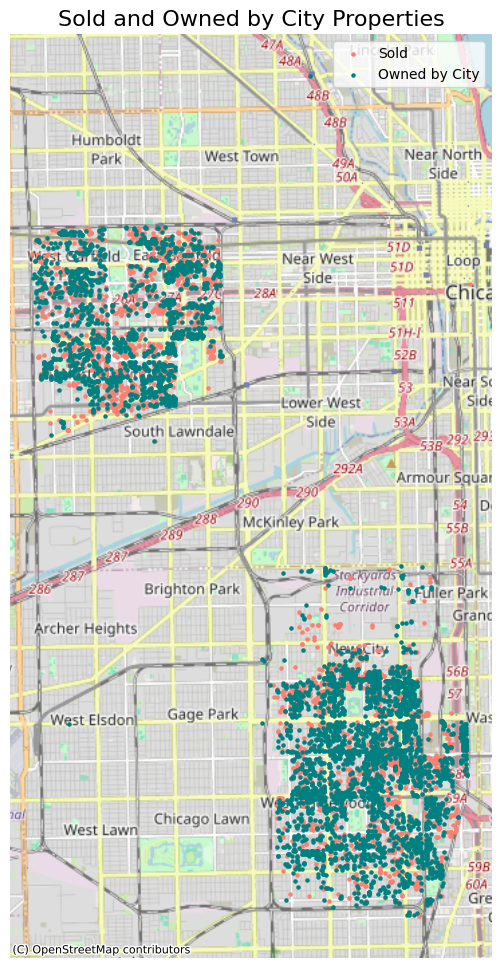

In [87]:
# Load the data
file_path = '/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/new_assessment/assessment_and_city_owned_new_data.csv'

try:
    df = pd.read_csv(
        file_path,
        dtype={
            'pin': str,
            'Zip Code': str,
            'census_tract_geoid': str,
            'Property Status': str
        }
    )
except FileNotFoundError:
    print(f"Error: File not found at {file_path}")
    exit()
except Exception as e:
    print(f"Error loading data: {e}")
    exit()

# Select specific areas
selected_areas = ['ENGLEWOOD', 'WEST ENGLEWOOD', 'NORTH LAWNDALE', 'WEST GARFIELD PARK', 'EAST GARFIELD PARK', 'NEW CITY']
df_selected = df[df['chicago_community_area_name'].str.upper().isin(selected_areas)].copy()

# Ensure Longitude and Latitude are numeric
df_selected['Longitude'] = pd.to_numeric(df_selected['Longitude'], errors='coerce')
df_selected['Latitude'] = pd.to_numeric(df_selected['Latitude'], errors='coerce')

# Drop rows with missing Longitude or Latitude
df_selected = df_selected.dropna(subset=['Longitude', 'Latitude'])

# Create GeoDataFrame
geometry = [Point(xy) for xy in zip(df_selected['Longitude'], df_selected['Latitude'])]
df_selected = gpd.GeoDataFrame(df_selected, geometry=geometry, crs="EPSG:4326")

# Filter for 'Sold' and 'Owned by City' properties
selected_statuses = ['Sold', 'Owned by City']
filtered_properties = df_selected[df_selected['Property Status'].isin(selected_statuses)]

# Display the filtered properties
print(filtered_properties)

# Color mapping for property status
color_mapping = {
    'Sold': 'Salmon',  # Orange
    'Owned by City': 'Teal',  # Green
}

# Create the map
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

# Plot the filtered properties
for status in selected_statuses:
    status_gdf = filtered_properties[filtered_properties['Property Status'] == status]
    status_gdf.to_crs(epsg=3857).plot(ax=ax, color=color_mapping[status], markersize=5, label=status)

# Add a basemap
cx.add_basemap(ax, source=cx.providers.OpenStreetMap.Mapnik)

# Remove axis
ax.set_axis_off()

# Add title
plt.title('Sold and Owned by City Properties', fontsize=16)

# Add legend
plt.legend()

# Show the map
plt.show()


### Folium for properties within df_selected (South and Southwest)

In [72]:

import folium
import geopandas as gpd
from folium.plugins import MarkerCluster

# Assuming df_selected is your DataFrame
# Verify it has 'geometry', 'Property Status' and other required columns
if not isinstance(df_selected, gpd.GeoDataFrame):
    print("Error: df_selected is not a GeoDataFrame.  Make sure you've created it correctly.")
    exit()

# Color mapping for property status
color_mapping = {
    'Sold': '#FFA500',  # Orange
    'Owned by City': '#008000',  # Green
    'Available for Sale': '#FFFF00',  # Yellow
    'Disposition Approved': '#800080', # Purple
    'Owned by Another Government Agency': '#0000FF', # Blue
    'Inter-Agency Transfer': '#A52A2A'  # Brown
}

# Initialize the folium map, centered on Chicago
m = folium.Map(location=[41.881832, -87.623177], zoom_start=10, control_scale=True)

# Marker cluster for property status markers
marker_cluster = MarkerCluster().add_to(m)

def get_color(status):
    return color_mapping.get(status, '#000000')  # Default to black if status not in mapping

# Add markers for properties
for idx, row in df_selected.iterrows():
    if not row.geometry.is_empty:
        folium.CircleMarker(
            location=[row.geometry.y, row.geometry.x],
            radius=5,
            popup=f"Property Status: {row['Property Status']}",
            color=get_color(row['Property Status']),
            fill=True,
            fillColor=get_color(row['Property Status']),
            fillOpacity=0.7
        ).add_to(marker_cluster)

# Load and add city boundaries
try:
    city_shape = gpd.read_file("/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/Data/Chicago_City_Limits-shp/Chicago_City_Limits.shp").to_crs(epsg=4326)
    folium.GeoJson(
        city_shape,
        name="City Boundary",
        style_function=lambda x: {'fillColor': 'pink', 'color': 'pink', 'weight': 1, 'fillOpacity': 0.4}
    ).add_to(m)
except Exception as e:
    print(f"Error loading city boundaries: {e}")

# Load and add CTA Bus Routes
try:
    cta_bus_routes = gpd.read_file("/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/Data/CTA_BusRoutes/CTA_BusRoutes.shp").to_crs(epsg=4326)
    folium.GeoJson(
        cta_bus_routes,
        name="CTA Bus Routes",
        style_function=lambda x: {"color": "blue", "weight": 2, "opacity": 0.5}
    ).add_to(m)
except Exception as e:
    print(f"Error loading CTA bus routes: {e}")

# Load and add CTA Rail Routes
try:
    cta_rail_routes = gpd.read_file("/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/Data/CTA_RailLines/CTA_RailLines.shp").to_crs(epsg=4326)
    folium.GeoJson(
        cta_rail_routes,
        name="CTA Rail Routes",
        style_function=lambda x: {"color": "red", "weight": 3, "opacity": 0.9}
    ).add_to(m)
except Exception as e:
    print(f"Error loading CTA rail routes: {e}")

# Load and add CTA Stations
try:
    cta_stations = gpd.read_file("/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/Data/CTA_RailStations/CTA_RailStations.shp").to_crs(epsg=4326)

    for idx, row in cta_stations.iterrows():
        if not row.geometry.is_empty:
            folium.CircleMarker(
                location=[row.geometry.y, row.geometry.x],
                radius=6,
                popup=f"Station: {row['LONGNAME']}",  # Adjust if column name is different
                color="red",
                fill=True,
                fillColor="red",
                fillOpacity=0.8
            ).add_to(m)
except Exception as e:
    print(f"Error loading CTA stations: {e}")

# Add layer control
folium.LayerControl().add_to(m)

# Display map
m.save("/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/maps/select_chicago_vacant_lots_map.html")
m

## Proximity to Rail

### Overall

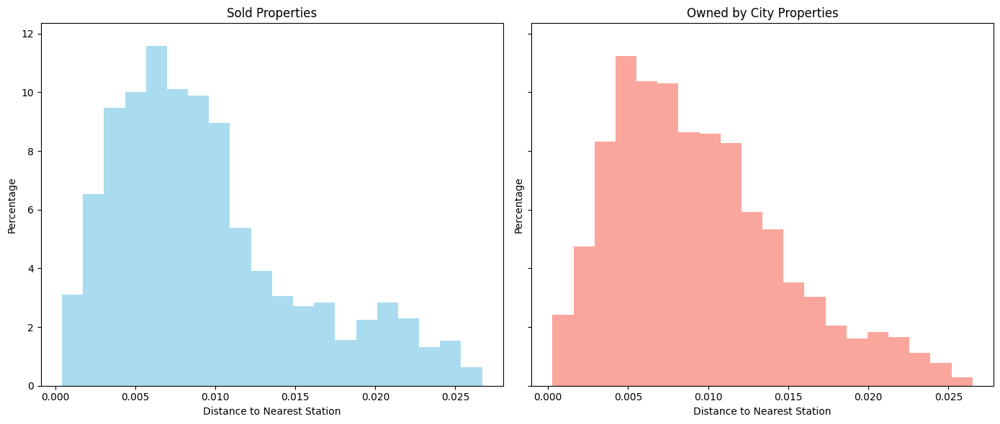

In [125]:
geometry = [Point(xy) for xy in zip(df_selected['Longitude'], df_selected['Latitude'])]
df_selected = gpd.GeoDataFrame(df_selected, geometry=geometry, crs="EPSG:4326")

# Load railway stations data
cta_stations = gpd.read_file("/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/Data/CTA_RailStations/CTA_RailStations.shp").to_crs(epsg=4326)

# Function to calculate distance to nearest station
def calculate_distance_to_nearest_station(row):
    distances = []
    for idx, station in cta_stations.iterrows():
        distance = row.geometry.distance(station.geometry)
        distances.append(distance)
    return min(distances)

# Calculate distance to nearest station for each plot
df_selected['Distance to Station'] = df_selected.apply(calculate_distance_to_nearest_station, axis=1)

# Filter for 'Sold' and 'Owned by City' properties
sold_properties = df_selected[df_selected['Property Status'] == 'Sold']['Distance to Station']
owned_by_city_properties = df_selected[df_selected['Property Status'] == 'Owned by City']['Distance to Station']

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

# Function to plot percentage histogram
def plot_percentage_histogram(ax, data, color, title):
    # Calculate counts and bins
    counts, bins = np.histogram(data, bins=20)
    
    # Calculate percentages
    total = len(data)
    percentages = counts / total * 100
    
    # Plot bar chart
    ax.bar(bins[:-1], percentages, width=np.diff(bins), color=color, alpha=0.7, align='edge')
    
    ax.set_xlabel('Distance to Nearest Station')
    ax.set_ylabel('Percentage')
    ax.set_title(title)
    ax.set_ylim(0, max(percentages) * 1.1)  # Set y-axis limit with some padding
    ax.ticklabel_format(axis='y', style='plain')  # Ensure y-axis labels are plain numbers

# Plot percentage histogram for 'Sold' properties
plot_percentage_histogram(axes[0], sold_properties, 'skyblue', 'Sold Properties')

# Plot percentage histogram for 'Owned by City' properties
plot_percentage_histogram(axes[1], owned_by_city_properties, 'salmon', 'Owned by City Properties')

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()


In [82]:
print(df_selected.crs)
print(cta_stations.crs)


EPSG:3435
EPSG:3435


In [80]:
# Reproject both to EPSG:26916
cta_stations = cta_stations.to_crs(epsg=26916)
df_selected = df_selected.to_crs(epsg=26916)


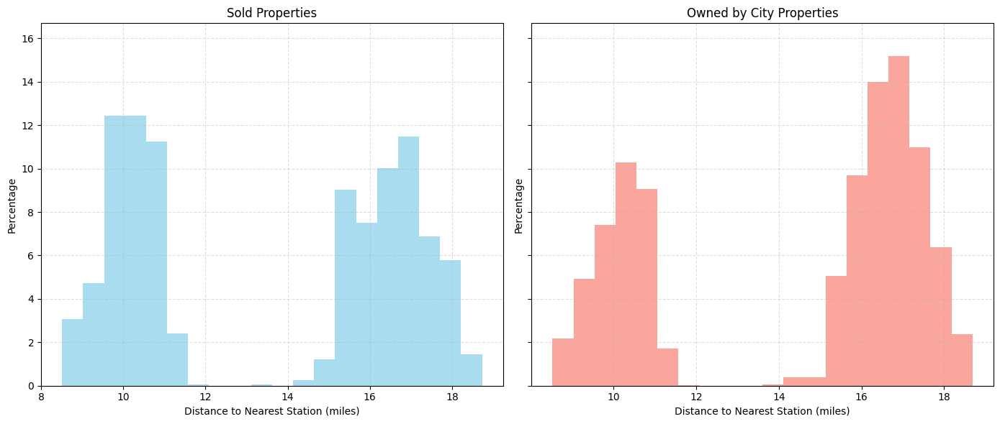

In [89]:
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from shapely.geometry import Point

# --- Load and prepare property data ---
geometry = [Point(xy) for xy in zip(df_selected['Longitude'], df_selected['Latitude'])]
# df_selected = gpd.GeoDataFrame(df_selected, geometry=geometry, crs="EPSG:4326")

# --- Load and prepare station data ---
cta_stations = gpd.read_file("/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/Data/CTA_RailStations/CTA_RailStations.shp")
# cta_stations = cta_stations.to_crs(epsg=3435)  # Reproject to Illinois ft (NAD83)

# Reproject df_selected to match
df_selected = df_selected.to_crs(epsg=3435)

# --- Efficient nearest station distance calculation ---
cta_stations_sindex = cta_stations.sindex  # Build spatial index

def calculate_nearest_distance(point, cta_stations):
    nearest_idx = list(cta_stations_sindex.nearest(point.bounds, 1))[0]
    nearest_geom = cta_stations.iloc[nearest_idx].geometry
    return point.distance(nearest_geom)

# Calculate distance in feet and convert to miles
def calculate_nearest_distance(point, cta_stations):
    nearest_idx = list(cta_stations_sindex.nearest(point, 1))[0]
    nearest_geom = cta_stations.iloc[nearest_idx].geometry
    return point.distance(nearest_geom)

df_selected['Distance to Station (mi)'] = df_selected.geometry.apply(
    lambda point: calculate_nearest_distance(point, cta_stations) / 5280
)

# --- Filter for 'Sold' and 'Owned by City' properties ---
sold_properties = df_selected[df_selected['Property Status'] == 'Sold']['Distance to Station (mi)']
owned_by_city_properties = df_selected[df_selected['Property Status'] == 'Owned by City']['Distance to Station (mi)']

# --- Plotting ---
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

def plot_percentage_histogram(ax, data, color, title):
    counts, bins = np.histogram(data, bins=20)
    total = len(data)
    percentages = counts / total * 100
    bin_centers = (bins[:-1] + bins[1:]) / 2

    ax.bar(bin_centers, percentages, width=np.diff(bins), color=color, alpha=0.7, align='center')
    ax.set_xlabel('Distance to Nearest Station (miles)')
    ax.set_ylabel('Percentage')
    ax.set_title(title)
    ax.set_ylim(0, max(percentages) * 1.1)
    ax.ticklabel_format(axis='y', style='plain')
    ax.grid(True, linestyle='--', alpha=0.4)

# Plot histograms
plot_percentage_histogram(axes[0], sold_properties, 'skyblue', 'Sold Properties')
plot_percentage_histogram(axes[1], owned_by_city_properties, 'salmon', 'Owned by City Properties')

plt.tight_layout()
plt.show()


### Distance from the Rail (For Commercial)

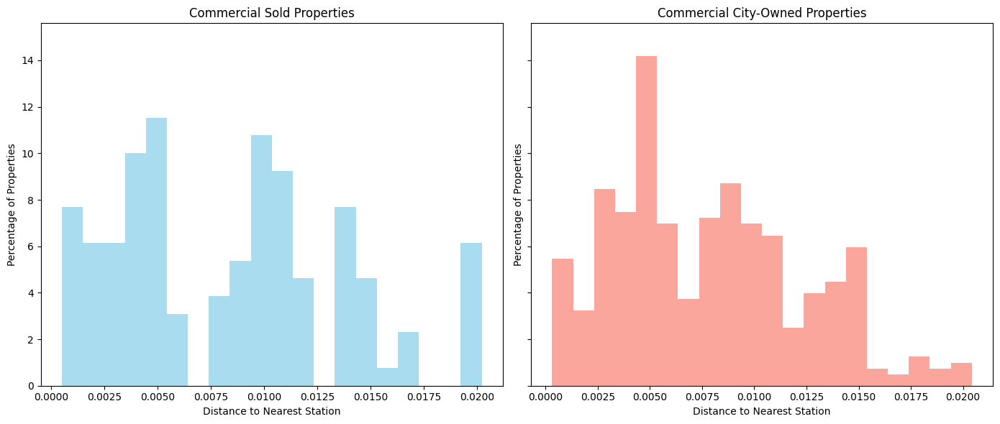

In [93]:
selected_areas = ['ENGLEWOOD', 'WEST ENGLEWOOD', 'NORTH LAWNDALE', 
                 'WEST GARFIELD PARK', 'EAST GARFIELD PARK', 'NEW CITY']
df_selected_commerical = df_selected[
    (df_selected['chicago_community_area_name'].str.upper().isin(selected_areas)) &
    (df_selected['zone'] == 'Commercial')  # Commercial zone filter
].copy()

# Ensure Longitude and Latitude are numeric
df_selected_commerical['Longitude'] = pd.to_numeric(df_selected_commerical['Longitude'], errors='coerce')
df_selected_commerical['Latitude'] = pd.to_numeric(df_selected_commerical['Latitude'], errors='coerce')

# Drop rows with missing Longitude or Latitude
df_selected_commerical = df_selected_commerical.dropna(subset=['Longitude', 'Latitude'])

# Create GeoDataFrame
geometry = [Point(xy) for xy in zip(df_selected_commerical['Longitude'], df_selected_commerical['Latitude'])]
df_selected_commerical = gpd.GeoDataFrame(df_selected_commerical, geometry=geometry, crs="EPSG:4326")

# Load railway stations data
cta_stations = gpd.read_file("/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/Data/CTA_RailStations/CTA_RailStations.shp").to_crs(epsg=4326)

# Function to calculate distance to nearest station
def calculate_distance_to_nearest_station(row):
    distances = []
    for idx, station in cta_stations.iterrows():
        distance = row.geometry.distance(station.geometry)
        distances.append(distance)
    return min(distances)

# Calculate distance to nearest station for each plot
df_selected_commerical['Distance to Station'] = df_selected_commerical.apply(calculate_distance_to_nearest_station, axis=1)

# Filter for 'Sold' and 'Owned by City' commercial properties
sold_properties = df_selected_commerical[
    (df_selected_commerical['Property Status'] == 'Sold') &
    (df_selected_commerical['zone'] == 'Commercial')  # Redundant filter for safety
]['Distance to Station']

owned_by_city_properties = df_selected_commerical[
    (df_selected_commerical['Property Status'] == 'Owned by City') &
    (df_selected_commerical['zone'] == 'Commercial')  # Redundant filter for safety
]['Distance to Station']

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

# Function to plot percentage histogram
def plot_percentage_histogram(ax, data, color, title):
    counts, bins = np.histogram(data, bins=20)
    total = len(data)
    percentages = counts / total * 100
    
    ax.bar(bins[:-1], percentages, width=np.diff(bins), color=color, alpha=0.7, align='edge')
    ax.set_xlabel('Distance to Nearest Station')
    ax.set_ylabel('Percentage of Properties')
    ax.set_title(title)
    ax.set_ylim(0, max(percentages) * 1.1)
    ax.ticklabel_format(axis='y', style='plain')

# Plot histograms
plot_percentage_histogram(axes[0], sold_properties, 'skyblue', 'Commercial Sold Properties')
plot_percentage_histogram(axes[1], owned_by_city_properties, 'salmon', 'Commercial City-Owned Properties')

# Adjust layout
plt.tight_layout()
plt.show()


### Distance from the Rail (For Commercial) in miles

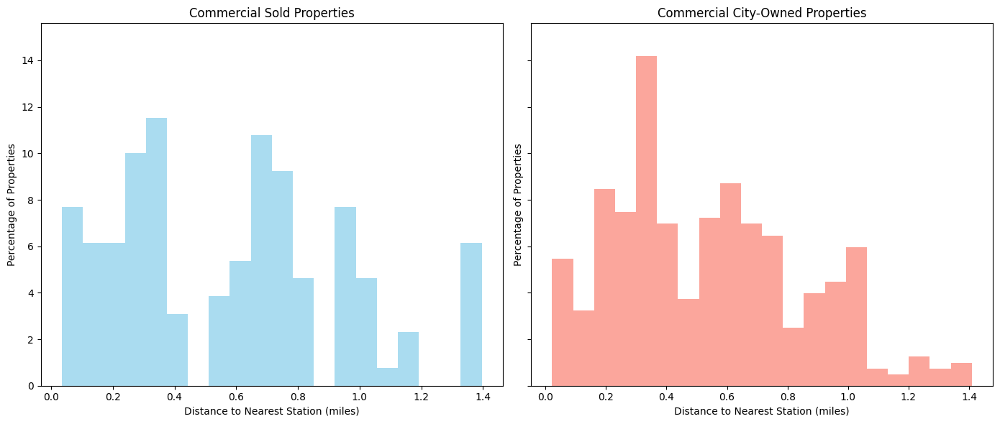

In [94]:
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
from shapely.geometry import Point

# Select relevant community areas and commercial zone
selected_areas = ['ENGLEWOOD', 'WEST ENGLEWOOD', 'NORTH LAWNDALE', 
                  'WEST GARFIELD PARK', 'EAST GARFIELD PARK', 'NEW CITY']
df_selected_commerical = df_selected[
    (df_selected['chicago_community_area_name'].str.upper().isin(selected_areas)) &
    (df_selected['zone'] == 'Commercial')
].copy()

# Ensure Longitude and Latitude are numeric
df_selected_commerical['Longitude'] = pd.to_numeric(df_selected_commerical['Longitude'], errors='coerce')
df_selected_commerical['Latitude'] = pd.to_numeric(df_selected_commerical['Latitude'], errors='coerce')

# Drop rows with missing Longitude or Latitude
df_selected_commerical = df_selected_commerical.dropna(subset=['Longitude', 'Latitude'])

# Create GeoDataFrame
geometry = [Point(xy) for xy in zip(df_selected_commerical['Longitude'], df_selected_commerical['Latitude'])]
df_selected_commerical = gpd.GeoDataFrame(df_selected_commerical, geometry=geometry, crs="EPSG:4326")

# Load railway stations data
cta_stations = gpd.read_file("/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/Data/CTA_RailStations/CTA_RailStations.shp").to_crs(epsg=4326)

# Function to calculate distance to nearest station (in miles)
def calculate_distance_to_nearest_station_miles(row):
    distances = []
    for idx, station in cta_stations.iterrows():
        distance = row.geometry.distance(station.geometry) * 69  # Convert degrees to miles
        distances.append(distance)
    return min(distances)

# Calculate distance to nearest station in miles for each plot
df_selected_commerical['Distance to Station'] = df_selected_commerical.apply(
    calculate_distance_to_nearest_station_miles, axis=1
)

# Filter for 'Sold' and 'Owned by City' commercial properties
sold_properties = df_selected_commerical[
    (df_selected_commerical['Property Status'] == 'Sold') &
    (df_selected_commerical['zone'] == 'Commercial')
]['Distance to Station']

owned_by_city_properties = df_selected_commerical[
    (df_selected_commerical['Property Status'] == 'Owned by City') &
    (df_selected_commerical['zone'] == 'Commercial')
]['Distance to Station']

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

# Function to plot percentage histogram
def plot_percentage_histogram(ax, data, color, title):
    counts, bins = np.histogram(data, bins=20)
    total = len(data)
    percentages = counts / total * 100

    ax.bar(bins[:-1], percentages, width=np.diff(bins), color=color, alpha=0.7, align='edge')
    ax.set_xlabel('Distance to Nearest Station (miles)')
    ax.set_ylabel('Percentage of Properties')
    ax.set_title(title)
    ax.set_ylim(0, max(percentages) * 1.1)
    ax.ticklabel_format(axis='y', style='plain')

# Plot histograms
plot_percentage_histogram(axes[0], sold_properties, 'skyblue', 'Commercial Sold Properties')
plot_percentage_histogram(axes[1], owned_by_city_properties, 'salmon', 'Commercial City-Owned Properties')

# Adjust layout
plt.tight_layout()
plt.show()


### For Residential

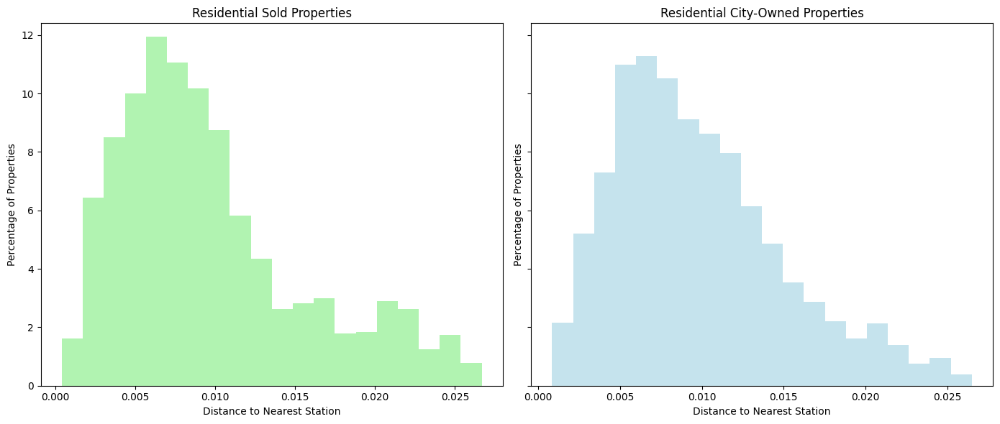

In [ ]:
# Select specific areas and residential zones
selected_areas = ['ENGLEWOOD', 'WEST ENGLEWOOD', 'NORTH LAWNDALE', 
                 'WEST GARFIELD PARK', 'EAST GARFIELD PARK', 'NEW CITY']
df_selected_residential = df_selected[
    (df_selected['chicago_community_area_name'].str.upper().isin(selected_areas)) &
    (df_selected['zone'] == 'Residential')  # Residential zone filter
].copy()

# Ensure Longitude and Latitude are numeric
df_selected_residential['Longitude'] = pd.to_numeric(df_selected_residential['Longitude'], errors='coerce')
df_selected_residential['Latitude'] = pd.to_numeric(df_selected_residential['Latitude'], errors='coerce')

# Drop rows with missing Longitude or Latitude
df_selected_residential = df_selected_residential.dropna(subset=['Longitude', 'Latitude'])

# Create GeoDataFrame
geometry = [Point(xy) for xy in zip(df_selected_residential['Longitude'], df_selected_residential['Latitude'])]
df_selected_residential = gpd.GeoDataFrame(df_selected_residential, geometry=geometry, crs="EPSG:4326")

# Load railway stations data
cta_stations = gpd.read_file("/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/Data/CTA_RailStations/CTA_RailStations.shp").to_crs(epsg=4326)

# Function to calculate distance to nearest station
def calculate_distance_to_nearest_station(row):
    distances = []
    for idx, station in cta_stations.iterrows():
        distance = row.geometry.distance(station.geometry)
        distances.append(distance)
    return min(distances)

# Calculate distance to nearest station for each plot
df_selected_residential['Distance to Station'] = df_selected_residential.apply(calculate_distance_to_nearest_station, axis=1)

# Filter for 'Sold' and 'Owned by City' residential properties
sold_properties = df_selected_residential[
    (df_selected_residential['Property Status'] == 'Sold') &
    (df_selected_residential['zone'] == 'Residential')  # Redundant filter
]['Distance to Station']

owned_by_city_properties = df_selected_residential[
    (df_selected_residential['Property Status'] == 'Owned by City') &
    (df_selected_residential['zone'] == 'Residential')  # Redundant filter
]['Distance to Station']

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

# Function to plot percentage histogram
def plot_percentage_histogram(ax, data, color, title):
    counts, bins = np.histogram(data, bins=20)
    total = len(data)
    percentages = counts / total * 100
    
    ax.bar(bins[:-1], percentages, width=np.diff(bins), color=color, alpha=0.7, align='edge')
    ax.set_xlabel('Distance to Nearest Station')
    ax.set_ylabel('Percentage of Properties')
    ax.set_title(title)
    ax.set_ylim(0, max(percentages) * 1.1)
    ax.ticklabel_format(axis='y', style='plain')

# Plot histograms
plot_percentage_histogram(axes[0], sold_properties, 'lightgreen', 'Residential Sold Properties')
plot_percentage_histogram(axes[1], owned_by_city_properties, 'lightblue', 'Residential City-Owned Properties')

# Adjust layout
plt.tight_layout()
plt.show()

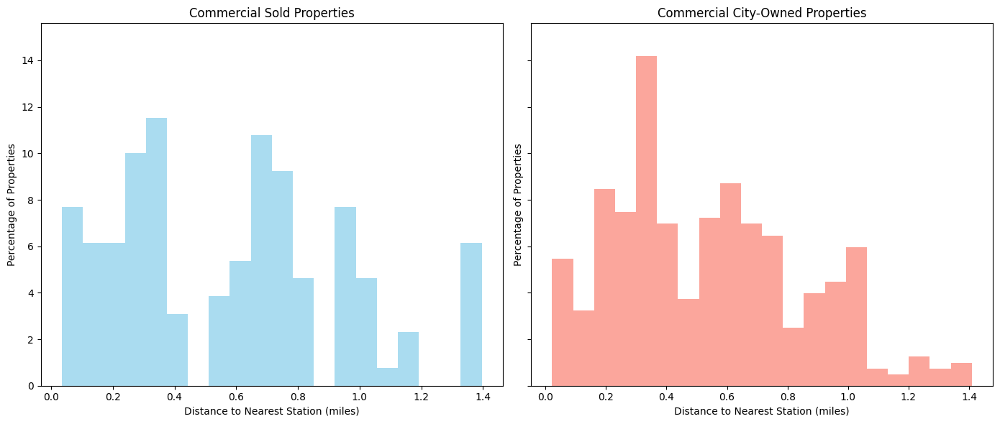

In [95]:
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
from shapely.geometry import Point

# Select relevant community areas and commercial zone
selected_areas = ['ENGLEWOOD', 'WEST ENGLEWOOD', 'NORTH LAWNDALE', 
                  'WEST GARFIELD PARK', 'EAST GARFIELD PARK', 'NEW CITY']
df_selected_commerical = df_selected[
    (df_selected['chicago_community_area_name'].str.upper().isin(selected_areas)) &
    (df_selected['zone'] == 'Commercial')
].copy()

# Ensure Longitude and Latitude are numeric
df_selected_commerical['Longitude'] = pd.to_numeric(df_selected_commerical['Longitude'], errors='coerce')
df_selected_commerical['Latitude'] = pd.to_numeric(df_selected_commerical['Latitude'], errors='coerce')

# Drop rows with missing Longitude or Latitude
df_selected_commerical = df_selected_commerical.dropna(subset=['Longitude', 'Latitude'])

# Create GeoDataFrame
geometry = [Point(xy) for xy in zip(df_selected_commerical['Longitude'], df_selected_commerical['Latitude'])]
df_selected_commerical = gpd.GeoDataFrame(df_selected_commerical, geometry=geometry, crs="EPSG:4326")

# Load railway stations data
cta_stations = gpd.read_file("/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/Data/CTA_RailStations/CTA_RailStations.shp").to_crs(epsg=4326)

# Function to calculate distance to nearest station (in miles)
def calculate_distance_to_nearest_station_miles(row):
    distances = []
    for idx, station in cta_stations.iterrows():
        distance = row.geometry.distance(station.geometry) * 69  # Convert degrees to miles
        distances.append(distance)
    return min(distances)

# Calculate distance to nearest station in miles for each plot
df_selected_commerical['Distance to Station'] = df_selected_commerical.apply(
    calculate_distance_to_nearest_station_miles, axis=1
)

# Filter for 'Sold' and 'Owned by City' commercial properties
sold_properties = df_selected_commerical[
    (df_selected_commerical['Property Status'] == 'Sold') &
    (df_selected_commerical['zone'] == 'Commercial')
]['Distance to Station']

owned_by_city_properties = df_selected_commerical[
    (df_selected_commerical['Property Status'] == 'Owned by City') &
    (df_selected_commerical['zone'] == 'Commercial')
]['Distance to Station']

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

# Function to plot percentage histogram
def plot_percentage_histogram(ax, data, color, title):
    counts, bins = np.histogram(data, bins=20)
    total = len(data)
    percentages = counts / total * 100

    ax.bar(bins[:-1], percentages, width=np.diff(bins), color=color, alpha=0.7, align='edge')
    ax.set_xlabel('Distance to Nearest Station (miles)')
    ax.set_ylabel('Percentage of Properties')
    ax.set_title(title)
    ax.set_ylim(0, max(percentages) * 1.1)
    ax.ticklabel_format(axis='y', style='plain')

# Plot histograms
plot_percentage_histogram(axes[0], sold_properties, 'skyblue', 'Commercial Sold Properties')
plot_percentage_histogram(axes[1], owned_by_city_properties, 'salmon', 'Commercial City-Owned Properties')

# Adjust layout
plt.tight_layout()
plt.show()


## Vacant Lot 

/var/folders/9c/cqhq_9tn7xg260y42gb15wym0000gn/T/ipykernel_85414/2540917061.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected['Date of Acquisition'] = pd.to_datetime(df_selected['Date of Acquisition'], errors='coerce')
/var/folders/9c/cqhq_9tn7xg260y42gb15wym0000gn/T/ipykernel_85414/2540917061.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected['Latitude'] = df_selected['Latitude'].fillna(df_selected['Latitude'].mean()) # or 0 or other strategy
/var/folders/9c/cqhq_9tn7xg260y42gb

Cluster Statistics:
          pin  Land Value (2022)      Sq. Ft.
Cluster                                      
0        2900       30053.435685  1018.430003
1        2654       26127.667081   646.485835
2        1963       16470.537065   794.045876


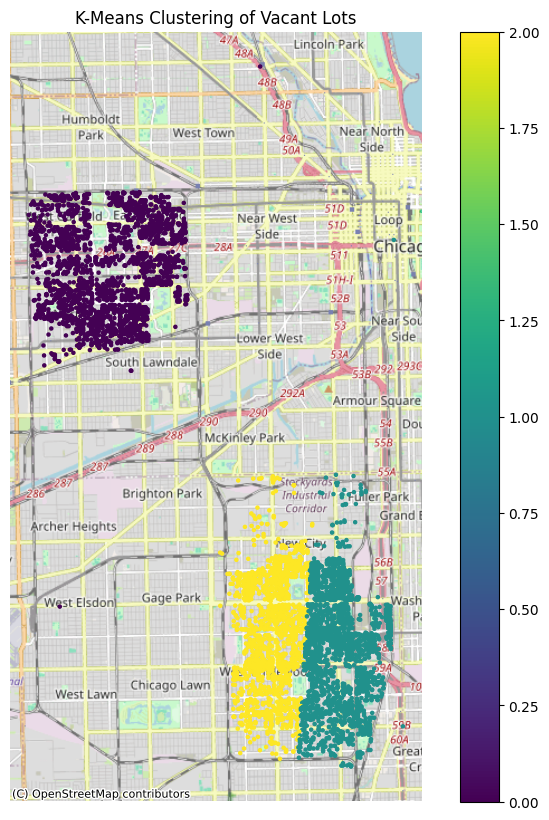

In [96]:
import pandas as pd
import geopandas as gpd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from shapely.geometry import Point  # Import Point
import matplotlib.pyplot as plt
import numpy as np

# # 1. Load the data
# try:
#     df_selected = pd.read_csv('/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/Data/assessment_and_city_owned_new_data.csv', dtype={'pin': str})
# except FileNotFoundError:
#     print("Error: CSV file not found.  Check the file path.")
#     exit()  # Exit if the file isn't found

# 2. Clean and prepare data
# Handle 'Date of Acquisition' errors robustly
df_selected['Date of Acquisition'] = pd.to_datetime(df_selected['Date of Acquisition'], errors='coerce')

# Fill missing lat/lon values *before* creating geometry
df_selected['Latitude'] = df_selected['Latitude'].fillna(df_selected['Latitude'].mean()) # or 0 or other strategy
df_selected['Longitude'] = df_selected['Longitude'].fillna(df_selected['Longitude'].mean()) # or 0

# 3. Create GeoDataFrame
try:
    geometry = [Point(xy) for xy in zip(df_selected['Longitude'], df_selected['Latitude'])]
    gdf = gpd.GeoDataFrame(df_selected, geometry=geometry, crs="EPSG:4326")
except Exception as e:
    print(f"Error creating GeoDataFrame: {e}")
    exit()

#4 Prepare Data for Clustering
#Select features and handle missing data

features = ['Latitude', 'Longitude']
X=gdf[features].copy()
X['Latitude']=pd.to_numeric(X['Latitude'], errors='coerce')
X['Longitude']=pd.to_numeric(X['Longitude'], errors='coerce')

X=X.dropna()

#Scale the Data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

#5 K-Means Clustering
# Determine number of clusters
n_clusters=3 #You can change this value

kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
gdf['Cluster'] = kmeans.fit_predict(X_scaled)

# 6 Plotting the Clusters (Basic)

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# You will want to use a base map for reference. There are a number of ways to do this
# Including using contextily
import contextily as cx
gdf.to_crs(epsg=3857).plot(column='Cluster', ax=ax, legend=True, markersize=5)
cx.add_basemap(ax, source=cx.providers.OpenStreetMap.Mapnik) # Or other tile providers
ax.set_axis_off()
plt.title('K-Means Clustering of Vacant Lots')

#7 Analyzing the Clusters
cluster_stats = gdf.groupby('Cluster').agg({
    'pin': 'count',  # Number of properties in the cluster
    'Land Value (2022)': 'mean',  # Average land value
    'Sq. Ft.': 'mean'  # Average square footage
})
print("Cluster Statistics:")
print(cluster_stats)


Data loaded successfully.
Selected 7517 records from specified areas.
GeoDataFrame created successfully.
K-Means clustering complete.


/var/folders/9c/cqhq_9tn7xg260y42gb15wym0000gn/T/ipykernel_85414/3353799686.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected['Date of Acquisition'] = pd.to_datetime(df_selected['Date of Acquisition'], errors='coerce')
/var/folders/9c/cqhq_9tn7xg260y42gb15wym0000gn/T/ipykernel_85414/3353799686.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected['Latitude'] = pd.to_numeric(df_selected['Latitude'], errors='coerce')
/var/folders/9c/cqhq_9tn7xg260y42gb15wym0000gn/T/ipykernel_85414/33

Error generating cluster plot: 'NoneType' object has no attribute 'set_bbox_to_anchor'
Cluster Statistics:
          pin  Land Value (2022)      Sq. Ft.
Cluster                                      
0        2900       30053.435685  1018.430003
1        2654       26127.667081   646.485835
2        1963       16470.537065   794.045876
Script completed.


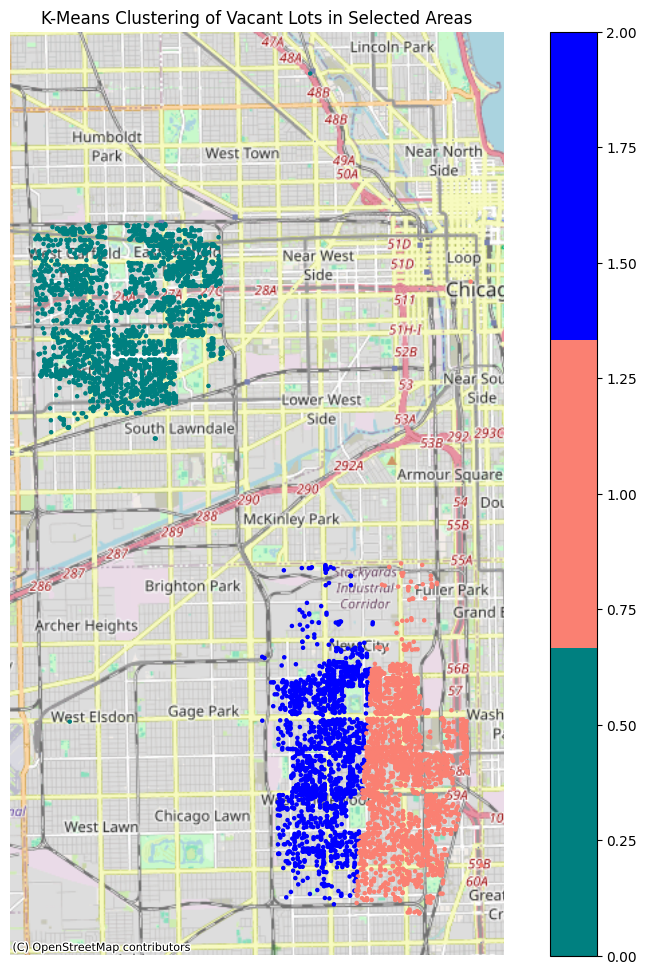

In [97]:
import pandas as pd
import geopandas as gpd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from shapely.geometry import Point
import matplotlib.pyplot as plt
import numpy as np
import contextily as cx

# File paths - Ensure these are correct
file_path = '/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/Data/assessment_and_city_owned_new_data.csv'
census_tracts_file = "/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/Data/CensusTractsTIGER2010_20250218.geojson"
landmarks_file = '/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/Data/Individual_Landmarks__Deprecated_January_2024__20250227.csv'

# --- 1. Load the Main Data with Correct Data Types ---
try:
    df = pd.read_csv(
        file_path,
        dtype={
            'pin': str,
            'Zip Code': str,
            'census_tract_geoid': str
        },
        low_memory=False
    )
    print("Data loaded successfully.")
except FileNotFoundError:
    print(f"Error: File not found at {file_path}")
    exit()
except Exception as e:
    print(f"Error loading data: {e}")
    exit()

# --- 2. Select specific areas ---
selected_areas = ['ENGLEWOOD', 'WEST ENGLEWOOD', 'NORTH LAWNDALE', 'WEST GARFIELD PARK', 'EAST GARFIELD PARK', 'NEW CITY']
df_selected = df[df['chicago_community_area_name'].str.upper().isin(selected_areas)]

if df_selected.empty:
    print("No data found for the selected areas. Please check the area names.")
    exit()

print(f"Selected {len(df_selected)} records from specified areas.")

# --- 3. Data Cleaning and Preparation ---
df_selected['Date of Acquisition'] = pd.to_datetime(df_selected['Date of Acquisition'], errors='coerce')
df_selected['Latitude'] = pd.to_numeric(df_selected['Latitude'], errors='coerce')
df_selected['Longitude'] = pd.to_numeric(df_selected['Longitude'], errors='coerce')

# Fill missing Latitude and Longitude
df_selected['Latitude'] = df_selected['Latitude'].fillna(df_selected['Latitude'].mean())
df_selected['Longitude'] = df_selected['Longitude'].fillna(df_selected['Longitude'].mean())

# --- 4. Create GeoDataFrame ---
try:
    geometry = [Point(xy) for xy in zip(df_selected['Longitude'], df_selected['Latitude'])]
    gdf = gpd.GeoDataFrame(df_selected, geometry=geometry, crs="EPSG:4326")
    print("GeoDataFrame created successfully.")
except Exception as e:
    print(f"Error creating GeoDataFrame: {e}")
    exit()

# --- 5. K-Means Clustering ---
try:
    X = gdf[['Latitude', 'Longitude']].copy()
    X = X.dropna()

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    n_clusters = 3
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    gdf.loc[:, 'Cluster'] = kmeans.fit_predict(X_scaled)

    print("K-Means clustering complete.")
except Exception as e:
    print(f"Error during K-Means clustering: {e}")

# --- 6. Plotting the Clusters with Contextily ---
try:
    fig, ax = plt.subplots(1, 1, figsize=(12, 12))
    
    # Create a custom colormap with teal and salmon
    custom_cmap = plt.cm.colors.ListedColormap(['teal', 'salmon', 'blue'])  # teal, salmon, off-white
    
    gdf.to_crs(epsg=3857).plot(column='Cluster', ax=ax, legend=True, markersize=5, cmap=custom_cmap)
    cx.add_basemap(ax, source=cx.providers.OpenStreetMap.Mapnik)
    ax.set_axis_off()
    plt.title('K-Means Clustering of Vacant Lots in Selected Areas')
    
    # Customize the legend
    legend = ax.get_legend()
    legend.set_bbox_to_anchor((1.05, 0.5))  # Adjust the position of the legend
    legend.set_title('Clusters')
    
    plt.tight_layout()
    plt.savefig('kmeans_clustering_map.png', dpi=300, bbox_inches='tight')
    print("Cluster plot generated and saved.")
except Exception as e:
    print(f"Error generating cluster plot: {e}")
    # --- 6. Analyzing the Clusters ---
try:
    cluster_stats = gdf.groupby('Cluster').agg(
        {'pin': 'count',  # Number of properties in the cluster
         'Land Value (2022)': 'mean',  # Average land value
         'Sq. Ft.': 'mean'}  # Average square footage
    )
    print("Cluster Statistics:")
    print(cluster_stats)

except Exception as e:
    print(f"Error during analysis: {e}")

print("Script completed.")

/var/folders/9c/cqhq_9tn7xg260y42gb15wym0000gn/T/ipykernel_85414/3292356916.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected['Latitude'] = pd.to_numeric(df_selected['Latitude'], errors='coerce')
/var/folders/9c/cqhq_9tn7xg260y42gb15wym0000gn/T/ipykernel_85414/3292356916.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected['Longitude'] = pd.to_numeric(df_selected['Longitude'], errors='coerce')
/var/folders/9c/cqhq_9tn7xg260y42gb15wym0000gn/T/ipykernel_85414/3292356916.py:28: Setti

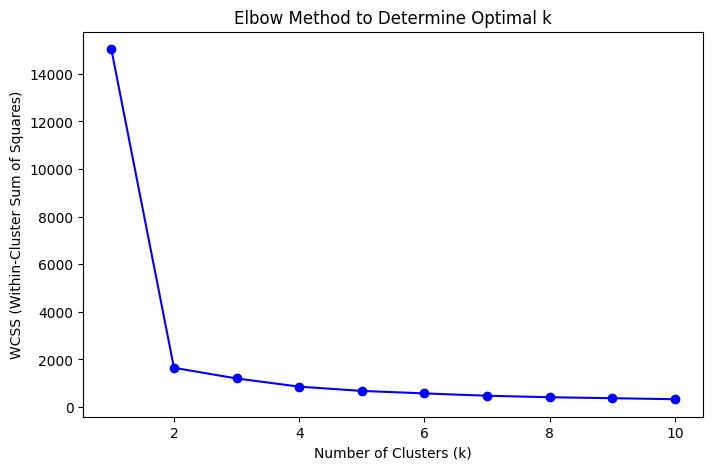

/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/venv_pol/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/venv_pol/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/venv_pol/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/venv_pol/lib/python3.13/site-packages/sklearn/cluster/_kmeans.py:237: RuntimeWarning: divide by zero encountered in matmul
  current_pot = closest_dist_sq @ sample_weight
/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_202

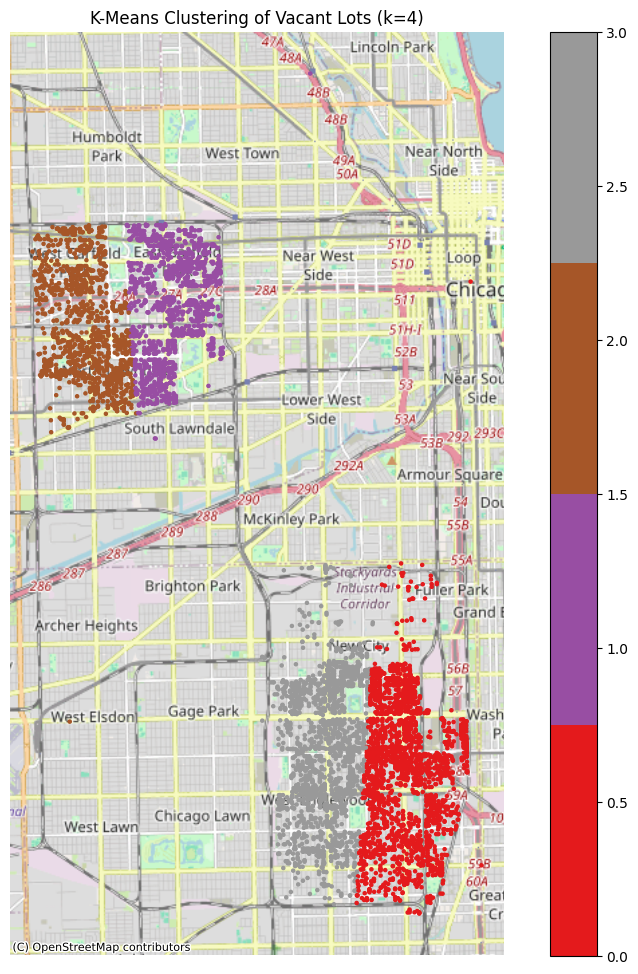

Clustering completed with k = 4


In [98]:
import pandas as pd
import geopandas as gpd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from shapely.geometry import Point
import matplotlib.pyplot as plt
import numpy as np
import contextily as cx

# File paths - Ensure these are correct
file_path = '/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/Data/assessment_and_city_owned_new_data.csv'

# --- 1. Load Data ---
df = pd.read_csv(
    file_path,
    dtype={'pin': str, 'Zip Code': str, 'census_tract_geoid': str},
    low_memory=False
)

# --- 2. Filter Selected Areas ---
selected_areas = ['ENGLEWOOD', 'WEST ENGLEWOOD', 'NORTH LAWNDALE', 'WEST GARFIELD PARK', 'EAST GARFIELD PARK', 'NEW CITY']
df_selected = df[df['chicago_community_area_name'].str.upper().isin(selected_areas)]

# --- 3. Data Cleaning ---
df_selected['Latitude'] = pd.to_numeric(df_selected['Latitude'], errors='coerce')
df_selected['Longitude'] = pd.to_numeric(df_selected['Longitude'], errors='coerce')

df_selected['Latitude'] = df_selected['Latitude'].fillna(df_selected['Latitude'].mean())
df_selected['Longitude'] = df_selected['Longitude'].fillna(df_selected['Longitude'].mean())

# --- 4. Create GeoDataFrame ---
geometry = [Point(xy) for xy in zip(df_selected['Longitude'], df_selected['Latitude'])]
gdf = gpd.GeoDataFrame(df_selected, geometry=geometry, crs="EPSG:4326")

# --- 5. Elbow Method for Optimal K ---
X = gdf[['Latitude', 'Longitude']].copy()
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

inertia = []
k_values = range(1, 11)  # Test k from 1 to 10

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)

# Plot the Elbow Curve
plt.figure(figsize=(8, 5))
plt.plot(k_values, inertia, marker='o', linestyle='-', color='b')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('WCSS (Within-Cluster Sum of Squares)')
plt.title('Elbow Method to Determine Optimal k')
plt.show()

# --- 6. Apply K-Means with Optimal K (Choose based on elbow) ---
optimal_k = int(input("Enter the optimal number of clusters based on the elbow plot: "))  # User input

kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
gdf.loc[:, 'Cluster'] = kmeans.fit_predict(X_scaled)

# --- 7. Plot Clusters ---
fig, ax = plt.subplots(1, 1, figsize=(12, 12))
custom_cmap = plt.cm.get_cmap('Set1', optimal_k)  # Color map with k unique colors

gdf.to_crs(epsg=3857).plot(column='Cluster', ax=ax, legend=True, markersize=5, cmap=custom_cmap)
cx.add_basemap(ax, source=cx.providers.OpenStreetMap.Mapnik)
ax.set_axis_off()
plt.title(f'K-Means Clustering of Vacant Lots (k={optimal_k})')
plt.show()

print("Clustering completed with k =", optimal_k)


In [ ]:
from IPython.display import Image, display

# Display the saved K-Means clustering result image
display(Image(filename='kmeans_clustering_map.png'))
print("The K-Means clustering model was run in this notebook (final_code.ipynb).")

### Distanace to Amenities 

/var/folders/9c/cqhq_9tn7xg260y42gb15wym0000gn/T/ipykernel_85414/3157863925.py:30: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  return stations.distance(point).min() * 69  # degrees to miles
/var/folders/9c/cqhq_9tn7xg260y42gb15wym0000gn/T/ipykernel_85414/3157863925.py:40: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  vacant_gdf['dist_to_park_mi'] = vacant_gdf.geometry.apply(lambda pt: parks_gdf.distance(pt).min() * 69)


Vacant Lots Proximal Factors Summary:
Mean distance to CTA station (miles): 0.6514093671039516
Median distance to CTA station (miles): 0.5897715808483699
Lots near Western Ave: 3


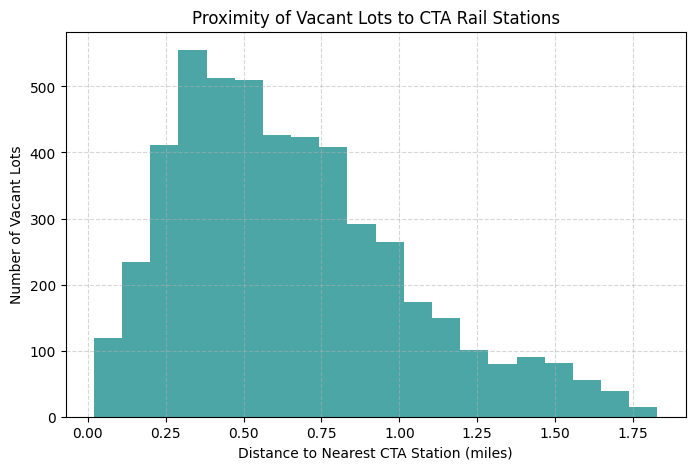

In [101]:
import pandas as pd
import geopandas as gpd
import numpy as np
from shapely.geometry import Point

import matplotlib.pyplot as plt

# --- Proximal Factors Analysis for Vacant Lots ---

# Assume df_selected is already filtered for vacant lots in selected areas and has valid lat/lon
# If not, filter for vacant lots (e.g., 'Property Status' == 'Owned by City' or other criteria)
vacant_lots = df_selected[df_selected['Property Status'] == 'Owned by City'].copy()

# Ensure numeric coordinates
vacant_lots['Longitude'] = pd.to_numeric(vacant_lots['Longitude'], errors='coerce')
vacant_lots['Latitude'] = pd.to_numeric(vacant_lots['Latitude'], errors='coerce')
vacant_lots = vacant_lots.dropna(subset=['Longitude', 'Latitude'])

# Create GeoDataFrame
geometry = [Point(xy) for xy in zip(vacant_lots['Longitude'], vacant_lots['Latitude'])]
vacant_gdf = gpd.GeoDataFrame(vacant_lots, geometry=geometry, crs="EPSG:4326")

# Load CTA stations
cta_stations = gpd.read_file(
    "/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/Data/CTA_RailStations/CTA_RailStations.shp"
).to_crs(epsg=4326)

# Calculate distance to nearest CTA station (in miles)
def nearest_station_distance(point, stations):
    return stations.distance(point).min() * 69  # degrees to miles

vacant_gdf['dist_to_station_mi'] = vacant_gdf.geometry.apply(lambda pt: nearest_station_distance(pt, cta_stations))

# Proximity to major roads (example: use longitude as proxy for Western Ave, or load a roads shapefile)
# For demonstration, let's use longitude threshold as a simple proxy
vacant_gdf['near_western_ave'] = vacant_gdf['Longitude'].between(-87.690, -87.680)

# Proximity to parks (if parks shapefile available, otherwise skip)
parks_gdf = gpd.read_file('/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/Data/ParkFacilities_Aug2012/ParkFacilities_Aug2012.shp').to_crs(epsg=4326)
vacant_gdf['dist_to_park_mi'] = vacant_gdf.geometry.apply(lambda pt: parks_gdf.distance(pt).min() * 69)

#Summary statistics
print("Vacant Lots Proximal Factors Summary:")
print("Mean distance to CTA station (miles):", vacant_gdf['dist_to_station_mi'].mean())
print("Median distance to CTA station (miles):", vacant_gdf['dist_to_station_mi'].median())
print("Lots near Western Ave:", vacant_gdf['near_western_ave'].sum())

# Histogram of distances to CTA station
plt.figure(figsize=(8, 5))
plt.hist(vacant_gdf['dist_to_station_mi'], bins=20, color='teal', alpha=0.7)
plt.xlabel('Distance to Nearest CTA Station (miles)')
plt.ylabel('Number of Vacant Lots')
plt.title('Proximity of Vacant Lots to CTA Rail Stations')
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

if 'zone' in vacant_gdf.columns:
    zone_proximity = vacant_gdf.groupby('zone')['dist_to_station_mi'].mean().sort_values()
    print("\nAverage distance to CTA station by zoning class:")
    print(zone_proximity)

/var/folders/9c/cqhq_9tn7xg260y42gb15wym0000gn/T/ipykernel_85414/675194360.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  lambda pt: parks_gdf.distance(pt).min() * 69
/var/folders/9c/cqhq_9tn7xg260y42gb15wym0000gn/T/ipykernel_85414/675194360.py:24: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  lambda pt: grocery_gdf.distance(pt).min() * 69


Mean distance to park (miles): 0.23966869482445913
Mean distance to grocery store (miles): 0.6854760884849864


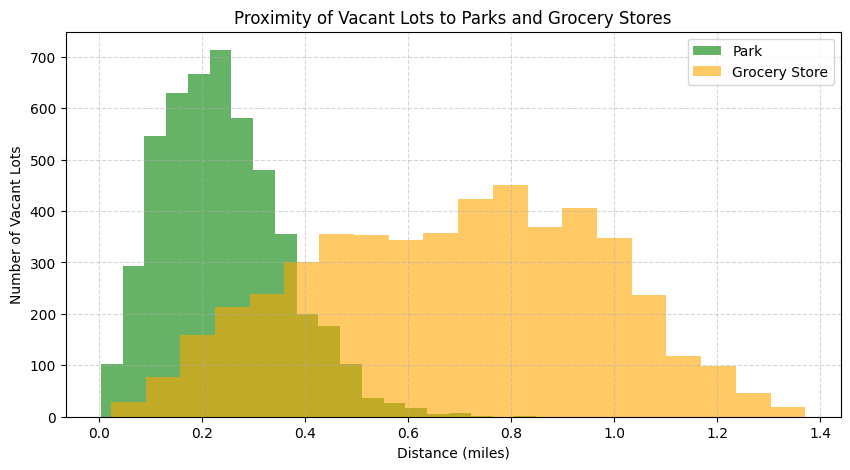

In [102]:
import geopandas as gpd
import pandas as pd

import matplotlib.pyplot as plt

# Example file paths (replace with your actual paths)
parks_shapefile = '/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/Data/ParkFacilities_Aug2012/ParkFacilities_Aug2012.shp'
grocery_shapefile = '/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/Data/Grocery Store Status - Historical_20250730/geo_export_78a670ec-57e9-4034-84a5-2f265eb16cd6.shp'

# Load parks and grocery stores shapefiles
parks_gdf = gpd.read_file(parks_shapefile).to_crs(epsg=4326)
grocery_gdf = gpd.read_file(grocery_shapefile).to_crs(epsg=4326)

# Ensure vacant_gdf is in the same CRS
vacant_gdf = vacant_gdf.to_crs(epsg=4326)

# Calculate distance to nearest park (in miles)
vacant_gdf['dist_to_park_mi'] = vacant_gdf.geometry.apply(
    lambda pt: parks_gdf.distance(pt).min() * 69
)

# Calculate distance to nearest grocery store (in miles)
vacant_gdf['dist_to_grocery_mi'] = vacant_gdf.geometry.apply(
    lambda pt: grocery_gdf.distance(pt).min() * 69
)

# Summary statistics
print("Mean distance to park (miles):", vacant_gdf['dist_to_park_mi'].mean())
print("Mean distance to grocery store (miles):", vacant_gdf['dist_to_grocery_mi'].mean())

# Plot histograms
plt.figure(figsize=(10, 5))
plt.hist(vacant_gdf['dist_to_park_mi'], bins=20, color='green', alpha=0.6, label='Park')
plt.hist(vacant_gdf['dist_to_grocery_mi'], bins=20, color='orange', alpha=0.6, label='Grocery Store')
plt.xlabel('Distance (miles)')
plt.ylabel('Number of Vacant Lots')
plt.title('Proximity of Vacant Lots to Parks and Grocery Stores')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

In [104]:
import geopandas as gpd
import pandas as pd
import numpy as np
from shapely.geometry import Point

# Assume vacant_gdf already exists and has valid geometry

# Load CTA stations shapefile
cta_stations = gpd.read_file(
    "/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/Data/CTA_RailStations/CTA_RailStations.shp"
).to_crs(epsg=4326)

# Calculate distance to nearest CTA station (in miles)
vacant_gdf['dist_to_cta_mi'] = vacant_gdf.geometry.apply(
    lambda pt: cta_stations.distance(pt).min() * 69
)

# Example third indicator: distance to nearest park (in miles)
parks_gdf = gpd.read_file(
    '/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/Data/ParkFacilities_Aug2012/ParkFacilities_Aug2012.shp'
).to_crs(epsg=4326)

vacant_gdf['dist_to_park_mi'] = vacant_gdf.geometry.apply(
    lambda pt: parks_gdf.distance(pt).min() * 69
)

# Now vacant_gdf has both 'dist_to_cta_mi' and 'dist_to_park_mi' as indicators
print(vacant_gdf[['dist_to_cta_mi', 'dist_to_park_mi']].head())

/var/folders/9c/cqhq_9tn7xg260y42gb15wym0000gn/T/ipykernel_85414/2891897077.py:15: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  lambda pt: cta_stations.distance(pt).min() * 69
/var/folders/9c/cqhq_9tn7xg260y42gb15wym0000gn/T/ipykernel_85414/2891897077.py:24: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  lambda pt: parks_gdf.distance(pt).min() * 69


      dist_to_cta_mi  dist_to_park_mi
1278        0.407953         0.270416
1279        0.424308         0.253904
1280        0.430591         0.247566
1281        0.436875         0.241228
1282        0.593340         0.082592


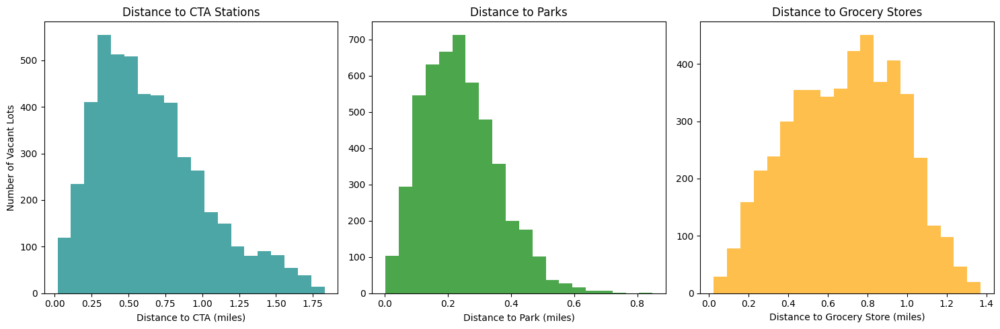

In [105]:
import matplotlib.pyplot as plt

# Plot histograms for distance to CTA, parks, and grocery stores
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.hist(vacant_gdf['dist_to_cta_mi'], bins=20, color='teal', alpha=0.7)
plt.xlabel('Distance to CTA (miles)')
plt.ylabel('Number of Vacant Lots')
plt.title('Distance to CTA Stations')

plt.subplot(1, 3, 2)
plt.hist(vacant_gdf['dist_to_park_mi'], bins=20, color='green', alpha=0.7)
plt.xlabel('Distance to Park (miles)')
plt.title('Distance to Parks')

plt.subplot(1, 3, 3)
plt.hist(vacant_gdf['dist_to_grocery_mi'], bins=20, color='orange', alpha=0.7)
plt.xlabel('Distance to Grocery Store (miles)')
plt.title('Distance to Grocery Stores')

plt.tight_layout()
plt.show()

### Do it by Neighborhood

Mean distance to CTA station (miles): 0.6521307421163969
Mean distance to park (miles): 0.2396589986053868
Mean distance to grocery store (miles): 0.6856791400063689


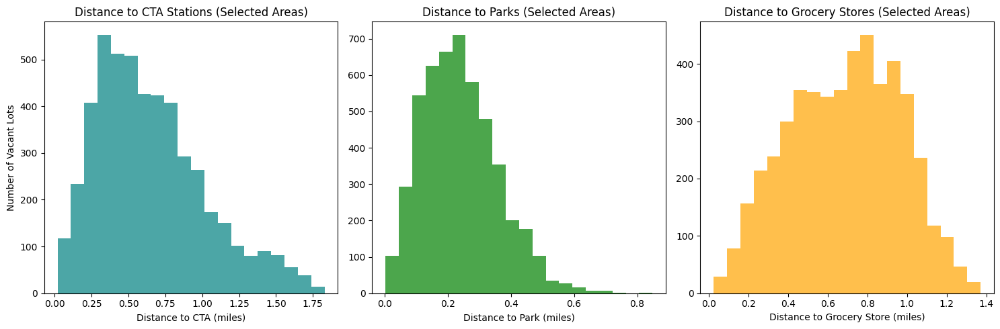

In [109]:
# Ensure selected_areas are uppercase for matching
selected_areas_upper = [area.upper() for area in selected_areas]

# Filter vacant_gdf for selected areas
vacant_selected = vacant_gdf[vacant_gdf['Community Area Name'].str.upper().isin(selected_areas_upper)].copy()

# Show summary statistics for selected areas
print("Mean distance to CTA station (miles):", vacant_selected['dist_to_cta_mi'].mean())
print("Mean distance to park (miles):", vacant_selected['dist_to_park_mi'].mean())
print("Mean distance to grocery store (miles):", vacant_selected['dist_to_grocery_mi'].mean())

# Plot histograms for selected areas
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.hist(vacant_selected['dist_to_cta_mi'], bins=20, color='teal', alpha=0.7)
plt.xlabel('Distance to CTA (miles)')
plt.ylabel('Number of Vacant Lots')
plt.title('Distance to CTA Stations (Selected Areas)')

plt.subplot(1, 3, 2)
plt.hist(vacant_selected['dist_to_park_mi'], bins=20, color='green', alpha=0.7)
plt.xlabel('Distance to Park (miles)')
plt.title('Distance to Parks (Selected Areas)')

plt.subplot(1, 3, 3)
plt.hist(vacant_selected['dist_to_grocery_mi'], bins=20, color='orange', alpha=0.7)
plt.xlabel('Distance to Grocery Store (miles)')
plt.title('Distance to Grocery Stores (Selected Areas)')

plt.tight_layout()
plt.show()

## Specific neighborhoods 

Englewood vacant lots (distance to CTA and park):
       dist_to_cta_mi  dist_to_park_mi
9081         0.878785         0.182127
10052        0.951520         0.055879
10053        0.952210         0.051542
10054        0.952922         0.047281
10055        0.953658         0.043120

West Garfield Park vacant lots (distance to CTA and park):
      dist_to_cta_mi  dist_to_park_mi
1278        0.407953         0.270416
1279        0.424308         0.253904
1280        0.430591         0.247566
1281        0.436875         0.241228
1282        0.593340         0.082592


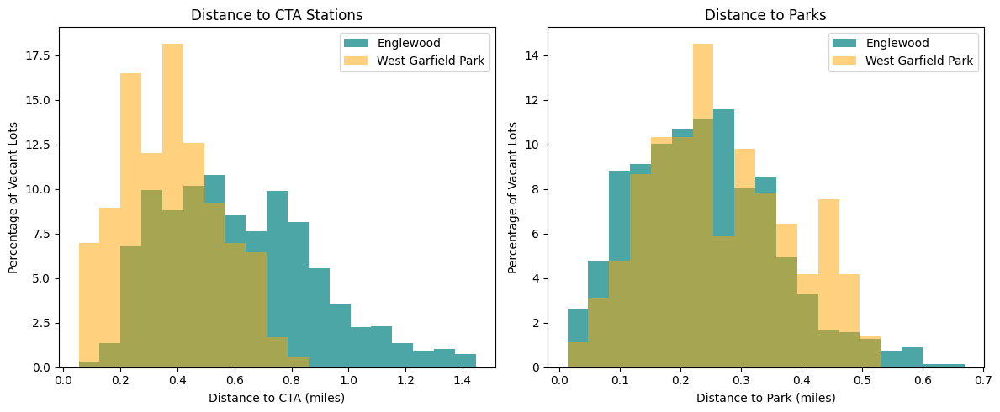

In [106]:
df_selected['Community Area Name'].value_counts()

Community Area Name
ENGLEWOOD                 1889
NEW CITY                  1372
NORTH LAWNDALE            1358
WEST ENGLEWOOD            1348
EAST GARFIELD PARK         999
WEST GARFIELD PARK         531
NEAR WEST SIDE               4
LOOP                         3
SOUTH LAWNDALE               3
GREATER GRAND CROSSING       2
WASHINGTON HEIGHTS           1
WEST ELSDON                  1
GAGE PARK                    1
WASHINGTON PARK              1
AUBURN GRESHAM               1
AUSTIN                       1
ARCHER HEIGHTS               1
BRIDGEPORT                   1
Name: count, dtype: int64

## Compare Englewood and West Garfield wrt distances of Vacant lots from these utilities

See if area makes any difference

Regression to differeniatae between these areas

In [112]:
selected_areas = ['ENGLEWOOD', 'WEST ENGLEWOOD', 'NORTH LAWNDALE', 
                  'WEST GARFIELD PARK', 'EAST GARFIELD PARK', 'NEW CITY']

Englewood vacant lots (distance to CTA and park):
       dist_to_cta_mi  dist_to_park_mi
9081         0.878785         0.182127
10052        0.951520         0.055879
10053        0.952210         0.051542
10054        0.952922         0.047281
10055        0.953658         0.043120

West Garfield Park vacant lots (distance to CTA and park):
      dist_to_cta_mi  dist_to_park_mi
1278        0.407953         0.270416
1279        0.424308         0.253904
1280        0.430591         0.247566
1281        0.436875         0.241228
1282        0.593340         0.082592


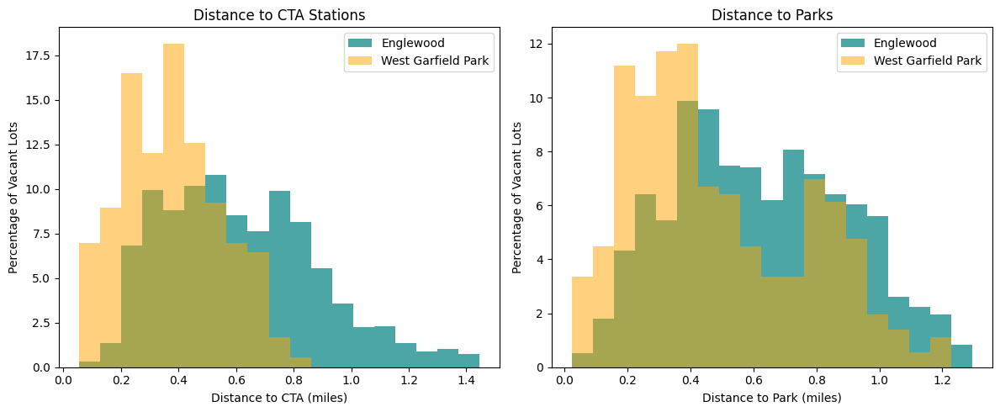

In [126]:
import numpy as np

# Filter vacant_gdf for Englewood and West Garfield Park
areas_of_interest = ['ENGLEWOOD', 'WEST GARFIELD PARK']
vacant_englewood = vacant_gdf[vacant_gdf['Community Area Name'].str.upper() == 'ENGLEWOOD']
vacant_west_garfield = vacant_gdf[vacant_gdf['Community Area Name'].str.upper() == 'WEST GARFIELD PARK']

# Print distance indicators for both areas
print("Englewood vacant lots (distance to CTA and park):")
print(vacant_englewood[['dist_to_cta_mi', 'dist_to_park_mi']].head())

print("\nWest Garfield Park vacant lots (distance to CTA and park):")
print(vacant_west_garfield[['dist_to_cta_mi', 'dist_to_park_mi']].head())

import matplotlib.pyplot as plt

plt.figure(figsize=(12, 5))

# Distance to CTA
plt.subplot(1, 2, 1)
englewood_cta = vacant_englewood['dist_to_cta_mi'].dropna()
west_garfield_cta = vacant_west_garfield['dist_to_cta_mi'].dropna()
bins = np.linspace(
    min(englewood_cta.min(), west_garfield_cta.min()),
    max(englewood_cta.max(), west_garfield_cta.max()),
    20
)
eng_counts, _ = np.histogram(englewood_cta, bins=bins)
wg_counts, _ = np.histogram(west_garfield_cta, bins=bins)
eng_pct = eng_counts / englewood_cta.size * 100
wg_pct = wg_counts / west_garfield_cta.size * 100
bin_centers = (bins[:-1] + bins[1:]) / 2
plt.bar(bin_centers, eng_pct, width=np.diff(bins), color='teal', alpha=0.7, label='Englewood', align='center')
plt.bar(bin_centers, wg_pct, width=np.diff(bins), color='orange', alpha=0.5, label='West Garfield Park', align='center')
plt.xlabel('Distance to CTA (miles)')
plt.ylabel('Percentage of Vacant Lots')
plt.title('Distance to CTA Stations')
plt.legend()

# Distance to Park
plt.subplot(1, 2, 2)
englewood_park = vacant_englewood['dist_to_park_mi'].dropna()
west_garfield_park = vacant_west_garfield['dist_to_park_mi'].dropna()
bins = np.linspace(
    min(englewood_park.min(), west_garfield_park.min()),
    max(englewood_park.max(), west_garfield_park.max()),
    20
)
eng_counts, _ = np.histogram(englewood_park, bins=bins)
wg_counts, _ = np.histogram(west_garfield_park, bins=bins)
eng_pct = eng_counts / englewood_park.size * 100
wg_pct = wg_counts / west_garfield_park.size * 100
bin_centers = (bins[:-1] + bins[1:]) / 2



# Distance to grocery store for Englewood and West Garfield Park vacant lots
englewood_grocery = vacant_englewood['dist_to_grocery_mi'].dropna()
west_garfield_grocery = vacant_west_garfield['dist_to_grocery_mi'].dropna()

bins = np.linspace(
    min(englewood_grocery.min(), west_garfield_grocery.min()),
    max(englewood_grocery.max(), west_garfield_grocery.max()),
    20
)
eng_counts, _ = np.histogram(englewood_grocery, bins=bins)
wg_counts, _ = np.histogram(west_garfield_grocery, bins=bins)
eng_pct = eng_counts / englewood_grocery.size * 100
wg_pct = wg_counts / west_garfield_grocery.size * 100
bin_centers = (bins[:-1] + bins[1:]) / 2

plt.bar(bin_centers, eng_pct, width=np.diff(bins), color='teal', alpha=0.7, label='Englewood', align='center')
plt.bar(bin_centers, wg_pct, width=np.diff(bins), color='orange', alpha=0.5, label='West Garfield Park', align='center')
plt.xlabel('Distance to Park (miles)')
plt.ylabel('Percentage of Vacant Lots')
plt.title('Distance to Parks')
plt.legend()

plt.tight_layout()
plt.show()

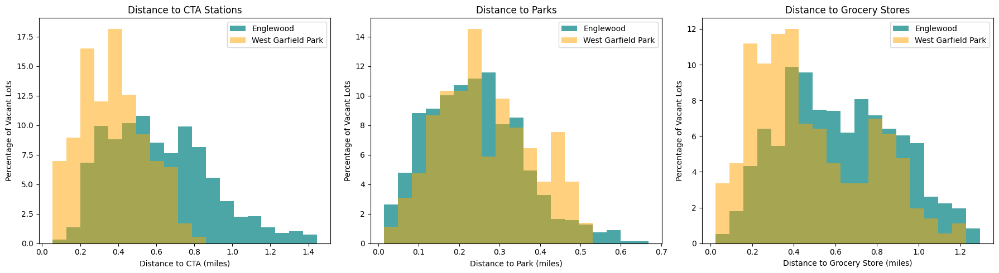

In [116]:
import numpy as np

import matplotlib.pyplot as plt

# Prepare data for Englewood and West Garfield Park
englewood_cta = vacant_englewood['dist_to_cta_mi'].dropna()
englewood_park = vacant_englewood['dist_to_park_mi'].dropna()
englewood_grocery = vacant_englewood['dist_to_grocery_mi'].dropna()

west_garfield_cta = vacant_west_garfield['dist_to_cta_mi'].dropna()
west_garfield_park = vacant_west_garfield['dist_to_park_mi'].dropna()
west_garfield_grocery = vacant_west_garfield['dist_to_grocery_mi'].dropna()

# Define bins for each indicator
cta_bins = np.linspace(
    min(englewood_cta.min(), west_garfield_cta.min()),
    max(englewood_cta.max(), west_garfield_cta.max()),
    20
)
park_bins = np.linspace(
    min(englewood_park.min(), west_garfield_park.min()),
    max(englewood_park.max(), west_garfield_park.max()),
    20
)
grocery_bins = np.linspace(
    min(englewood_grocery.min(), west_garfield_grocery.min()),
    max(englewood_grocery.max(), west_garfield_grocery.max()),
    20
)

# Calculate percentages for each indicator
def get_pct(data, bins):
    counts, _ = np.histogram(data, bins=bins)
    pct = counts / data.size * 100
    return pct

eng_cta_pct = get_pct(englewood_cta, cta_bins)
wg_cta_pct = get_pct(west_garfield_cta, cta_bins)
eng_park_pct = get_pct(englewood_park, park_bins)
wg_park_pct = get_pct(west_garfield_park, park_bins)
eng_grocery_pct = get_pct(englewood_grocery, grocery_bins)
wg_grocery_pct = get_pct(west_garfield_grocery, grocery_bins)

cta_centers = (cta_bins[:-1] + cta_bins[1:]) / 2
park_centers = (park_bins[:-1] + park_bins[1:]) / 2
grocery_centers = (grocery_bins[:-1] + grocery_bins[1:]) / 2

# Plot subplots
plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
plt.bar(cta_centers, eng_cta_pct, width=np.diff(cta_bins), color='teal', alpha=0.7, label='Englewood', align='center')
plt.bar(cta_centers, wg_cta_pct, width=np.diff(cta_bins), color='orange', alpha=0.5, label='West Garfield Park', align='center')
plt.xlabel('Distance to CTA (miles)')
plt.ylabel('Percentage of Vacant Lots')
plt.title('Distance to CTA Stations')
plt.legend()

plt.subplot(1, 3, 2)
plt.bar(park_centers, eng_park_pct, width=np.diff(park_bins), color='teal', alpha=0.7, label='Englewood', align='center')
plt.bar(park_centers, wg_park_pct, width=np.diff(park_bins), color='orange', alpha=0.5, label='West Garfield Park', align='center')
plt.xlabel('Distance to Park (miles)')
plt.ylabel('Percentage of Vacant Lots')
plt.title('Distance to Parks')
plt.legend()

plt.subplot(1, 3, 3)
plt.bar(grocery_centers, eng_grocery_pct, width=np.diff(grocery_bins), color='teal', alpha=0.7, label='Englewood', align='center')
plt.bar(grocery_centers, wg_grocery_pct, width=np.diff(grocery_bins), color='orange', alpha=0.5, label='West Garfield Park', align='center')
plt.xlabel('Distance to Grocery Store (miles)')
plt.ylabel('Percentage of Vacant Lots')
plt.title('Distance to Grocery Stores')
plt.legend()

plt.tight_layout()
plt.show()

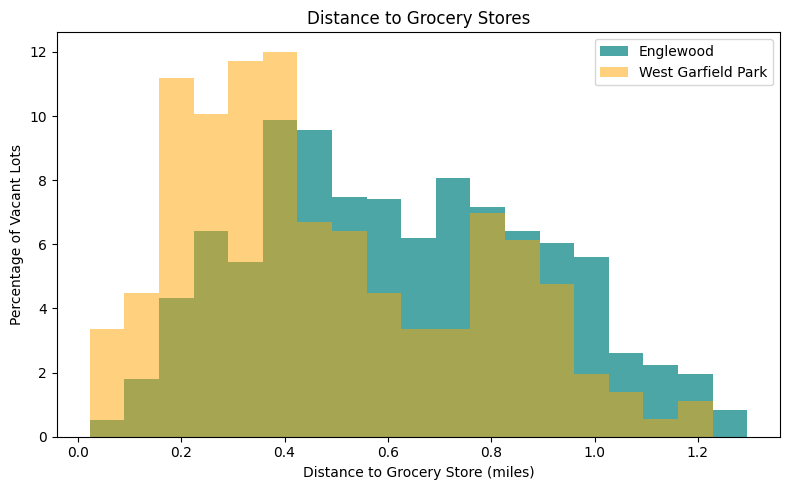

In [114]:
import matplotlib.pyplot as plt

# Distance to grocery store for Englewood and West Garfield Park vacant lots
englewood_grocery = vacant_englewood['dist_to_grocery_mi'].dropna()
west_garfield_grocery = vacant_west_garfield['dist_to_grocery_mi'].dropna()

bins = np.linspace(
    min(englewood_grocery.min(), west_garfield_grocery.min()),
    max(englewood_grocery.max(), west_garfield_grocery.max()),
    20
)
eng_counts, _ = np.histogram(englewood_grocery, bins=bins)
wg_counts, _ = np.histogram(west_garfield_grocery, bins=bins)
eng_pct = eng_counts / englewood_grocery.size * 100
wg_pct = wg_counts / west_garfield_grocery.size * 100
bin_centers = (bins[:-1] + bins[1:]) / 2

plt.figure(figsize=(8, 5))
plt.bar(bin_centers, eng_pct, width=np.diff(bins), color='teal', alpha=0.7, label='Englewood', align='center')
plt.bar(bin_centers, wg_pct, width=np.diff(bins), color='orange', alpha=0.5, label='West Garfield Park', align='center')
plt.xlabel('Distance to Grocery Store (miles)')
plt.ylabel('Percentage of Vacant Lots')
plt.title('Distance to Grocery Stores')
plt.legend()
plt.tight_layout()
plt.show()

## ML Model

In [ ]:
import pandas as pd

import statsmodels.api as sm

vacant_selected['Community Area Name'] = vacant_selected['Community Area Name'].str.upper()
agg_df = vacant_selected.groupby('Community Area Name').agg(
    vacant_lot_count=('pin', 'count'),
    mean_dist_grocery=('dist_to_grocery_mi', 'mean'),
    mean_dist_park=('dist_to_park_mi', 'mean'),
    mean_dist_cta=('dist_to_cta_mi', 'mean')
).reset_index()

X = agg_df[['mean_dist_grocery', 'mean_dist_park', 'mean_dist_cta']]
y = agg_df['vacant_lot_count']

X = sm.add_constant(X)

model = sm.OLS(y, X).fit()

print(model.summary())

                            OLS Regression Results                            
Dep. Variable:       vacant_lot_count   R-squared:                       0.155
Model:                            OLS   Adj. R-squared:                 -1.113
Method:                 Least Squares   F-statistic:                    0.1221
Date:                Wed, 30 Jul 2025   Prob (F-statistic):              0.939
Time:                        15:49:30   Log-Likelihood:                -42.520
No. Observations:                   6   AIC:                             93.04
Df Residuals:                       2   BIC:                             92.21
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const               366.6030   1911.21

/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/venv_pol/lib/python3.13/site-packages/statsmodels/stats/stattools.py:74: ValueWarning: omni_normtest is not valid with less than 8 observations; 6 samples were given.
  warn("omni_normtest is not valid with less than 8 observations; %i "


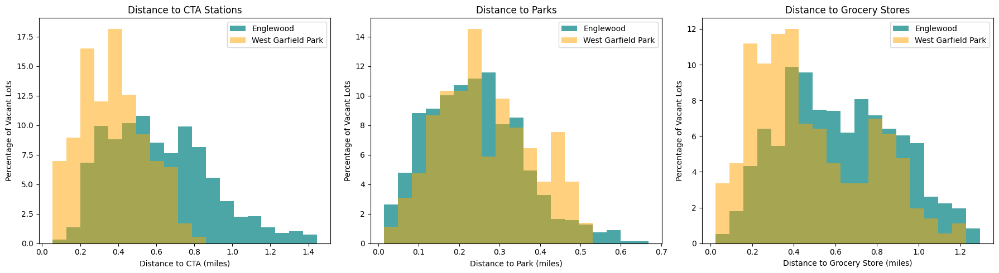

<Figure size 640x480 with 0 Axes>

In [141]:
import numpy as np

import matplotlib.pyplot as plt

# Filter vacant_gdf for Englewood and West Garfield Park
englewood = vacant_gdf[vacant_gdf['Community Area Name'].str.upper() == 'ENGLEWOOD']
west_garfield = vacant_gdf[vacant_gdf['Community Area Name'].str.upper() == 'WEST GARFIELD PARK']

# Prepare indicators
englewood_cta = englewood['dist_to_cta_mi'].dropna()
west_garfield_cta = west_garfield['dist_to_cta_mi'].dropna()
englewood_park = englewood['dist_to_park_mi'].dropna()
west_garfield_park = west_garfield['dist_to_park_mi'].dropna()
englewood_grocery = englewood['dist_to_grocery_mi'].dropna()
west_garfield_grocery = west_garfield['dist_to_grocery_mi'].dropna()

# Define bins for each indicator
cta_bins = np.linspace(
    min(englewood_cta.min(), west_garfield_cta.min()),
    max(englewood_cta.max(), west_garfield_cta.max()),
    20
)
park_bins = np.linspace(
    min(englewood_park.min(), west_garfield_park.min()),
    max(englewood_park.max(), west_garfield_park.max()),
    20
)
grocery_bins = np.linspace(
    min(englewood_grocery.min(), west_garfield_grocery.min()),
    max(englewood_grocery.max(), west_garfield_grocery.max()),
    20
)

def get_pct(data, bins):
    counts, _ = np.histogram(data, bins=bins)
    pct = counts / data.size * 100
    return pct

eng_cta_pct = get_pct(englewood_cta, cta_bins)
wg_cta_pct = get_pct(west_garfield_cta, cta_bins)
eng_park_pct = get_pct(englewood_park, park_bins)
wg_park_pct = get_pct(west_garfield_park, park_bins)
eng_grocery_pct = get_pct(englewood_grocery, grocery_bins)
wg_grocery_pct = get_pct(west_garfield_grocery, grocery_bins)

cta_centers = (cta_bins[:-1] + cta_bins[1:]) / 2
park_centers = (park_bins[:-1] + park_bins[1:]) / 2
grocery_centers = (grocery_bins[:-1] + grocery_bins[1:]) / 2

plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
plt.bar(cta_centers, eng_cta_pct, width=np.diff(cta_bins), color='teal', alpha=0.7, label='Englewood', align='center')
plt.bar(cta_centers, wg_cta_pct, width=np.diff(cta_bins), color='orange', alpha=0.5, label='West Garfield Park', align='center')
plt.xlabel('Distance to CTA (miles)')
plt.ylabel('Percentage of Vacant Lots')
plt.title('Distance to CTA Stations')
plt.legend()

plt.subplot(1, 3, 2)
plt.bar(park_centers, eng_park_pct, width=np.diff(park_bins), color='teal', alpha=0.7, label='Englewood', align='center')
plt.bar(park_centers, wg_park_pct, width=np.diff(park_bins), color='orange', alpha=0.5, label='West Garfield Park', align='center')
plt.xlabel('Distance to Park (miles)')
plt.ylabel('Percentage of Vacant Lots')
plt.title('Distance to Parks')
plt.legend()

plt.subplot(1, 3, 3)
plt.bar(grocery_centers, eng_grocery_pct, width=np.diff(grocery_bins), color='teal', alpha=0.7, label='Englewood', align='center')
plt.bar(grocery_centers, wg_grocery_pct, width=np.diff(grocery_bins), color='orange', alpha=0.5, label='West Garfield Park', align='center')
plt.xlabel('Distance to Grocery Store (miles)')
plt.ylabel('Percentage of Vacant Lots')
plt.title('Distance to Grocery Stores')
plt.legend()

plt.tight_layout()
plt.show()
plt.savefig('/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/maps/distances_maps.png', dpi=300)

## Logit model

In [137]:
import os
import geopandas as gpd
import pandas as pd
import statsmodels.api as sm
from shapely.geometry import Point

geometry = [Point(xy) for xy in zip(df_selected['Longitude'], df_selected['Latitude'])]
df_selected = gpd.GeoDataFrame(df_selected, geometry=geometry, crs="EPSG:4326")

cta_stations = gpd.read_file("/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/Data/CTA_RailStations/CTA_RailStations.shp").to_crs(epsg=4326)

parks_gdf = gpd.read_file("/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/Data/ParkFacilities_Aug2012/ParkFacilities_Aug2012.shp").to_crs(epsg=4326)

grocery_gdf = gpd.read_file("/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/Data/Grocery Store Status - Historical_20250730/geo_export_78a670ec-57e9-4034-84a5-2f265eb16cd6.shp").to_crs(epsg=4326)

df_selected['dist_to_cta_mi'] = df_selected.geometry.apply(lambda pt: cta_stations.distance(pt).min() * 69)

df_selected['dist_to_park_mi'] = df_selected.geometry.apply(lambda pt: parks_gdf.distance(pt).min() * 69)

df_selected['dist_to_grocery_mi'] = df_selected.geometry.apply(lambda pt: grocery_gdf.distance(pt).min() * 69)

df_selected['is_vacant'] = (df_selected['Property Status'] == 'Owned by City').astype(int)

areas = ['ENGLEWOOD', 'WEST GARFIELD PARK']
df_selected['Community Area Name'] = df_selected['Community Area Name'].str.upper()
df_logit = df_selected[df_selected['Community Area Name'].isin(areas)].copy()

df_logit['is_englewood'] = (df_logit['Community Area Name'] == 'ENGLEWOOD').astype(int)

X = df_logit[['dist_to_cta_mi', 'dist_to_park_mi', 'dist_to_grocery_mi', 'is_englewood']]
X = sm.add_constant(X)
y = df_logit['is_vacant']

logit_model = sm.Logit(y, X).fit()
print(logit_model.summary())
os.makedirs('logit_model_summaries', exist_ok=True)
with open("logit_model_summary_without_interaction.txt", "w") as f:
    f.write(logit_model.summary().as_text())


/var/folders/9c/cqhq_9tn7xg260y42gb15wym0000gn/T/ipykernel_85414/232070041.py:16: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  df_selected['dist_to_cta_mi'] = df_selected.geometry.apply(lambda pt: cta_stations.distance(pt).min() * 69)
/var/folders/9c/cqhq_9tn7xg260y42gb15wym0000gn/T/ipykernel_85414/232070041.py:18: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  df_selected['dist_to_park_mi'] = df_selected.geometry.apply(lambda pt: parks_gdf.distance(pt).min() * 69)
/var/folders/9c/cqhq_9tn7xg260y42gb15wym0000gn/T/ipykernel_85414/232070041.py:20: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS befor

Optimization terminated successfully.
         Current function value: 0.607819
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:              is_vacant   No. Observations:                 2420
Model:                          Logit   Df Residuals:                     2415
Method:                           MLE   Df Model:                            4
Date:                Thu, 31 Jul 2025   Pseudo R-squ.:                0.003841
Time:                        10:50:08   Log-Likelihood:                -1470.9
converged:                       True   LL-Null:                       -1476.6
Covariance Type:            nonrobust   LLR p-value:                   0.02295
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.9628      0.153      6.288      0.000       0.663       1.263
dist_

In [139]:
with open("logit_model_summaries/logit_model_summary_without_interaction.txt", "w") as f:
    f.write(logit_model.summary().as_text())

## Interactions

### Logistic regression with interaction terms between is_englewood and each distance variable


In [129]:
# Create interaction terms
df_logit['cta_x_englewood'] = df_logit['dist_to_cta_mi'] * df_logit['is_englewood']
df_logit['park_x_englewood'] = df_logit['dist_to_park_mi'] * df_logit['is_englewood']
df_logit['grocery_x_englewood'] = df_logit['dist_to_grocery_mi'] * df_logit['is_englewood']

# Define predictors including interaction terms
X_interact = df_logit[[
    'dist_to_cta_mi',
    'dist_to_park_mi',
    'dist_to_grocery_mi',
    'is_englewood',
    'cta_x_englewood',
    'park_x_englewood',
    'grocery_x_englewood'
]]

# Add constant term
X_interact = sm.add_constant(X_interact)

# Response variable
y = df_logit['is_vacant']

# Fit the logistic regression model
logit_model_interact = sm.Logit(y, X_interact).fit()
print(logit_model_interact.summary())


Optimization terminated successfully.
         Current function value: 0.605409
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:              is_vacant   No. Observations:                 2420
Model:                          Logit   Df Residuals:                     2412
Method:                           MLE   Df Model:                            7
Date:                Thu, 31 Jul 2025   Pseudo R-squ.:                0.007791
Time:                        10:37:29   Log-Likelihood:                -1465.1
converged:                       True   LL-Null:                       -1476.6
Covariance Type:            nonrobust   LLR p-value:                  0.001699
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   0.9253      0.309      2.999      0.003       0.321       1.530
di

The grocery_x_englewood interaction is significant and positive: in Englewood, unlike West Garfield, proximity to grocery stores is associated with more vacancy.


This reversal is statistically significant (p = 0.004), which could suggest something structurally different about these grocery stores (e.g., lower-quality or less stable businesses in Englewood?).

In [140]:
with open("logit_model_summaries/logit_model_summary_with_interaction.txt", "w") as f:
    f.write(logit_model_interact.summary().as_text())

## Lets visualize these two neighborhoods

/var/folders/9c/cqhq_9tn7xg260y42gb15wym0000gn/T/ipykernel_85414/4089745153.py:35: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend(loc='upper right')


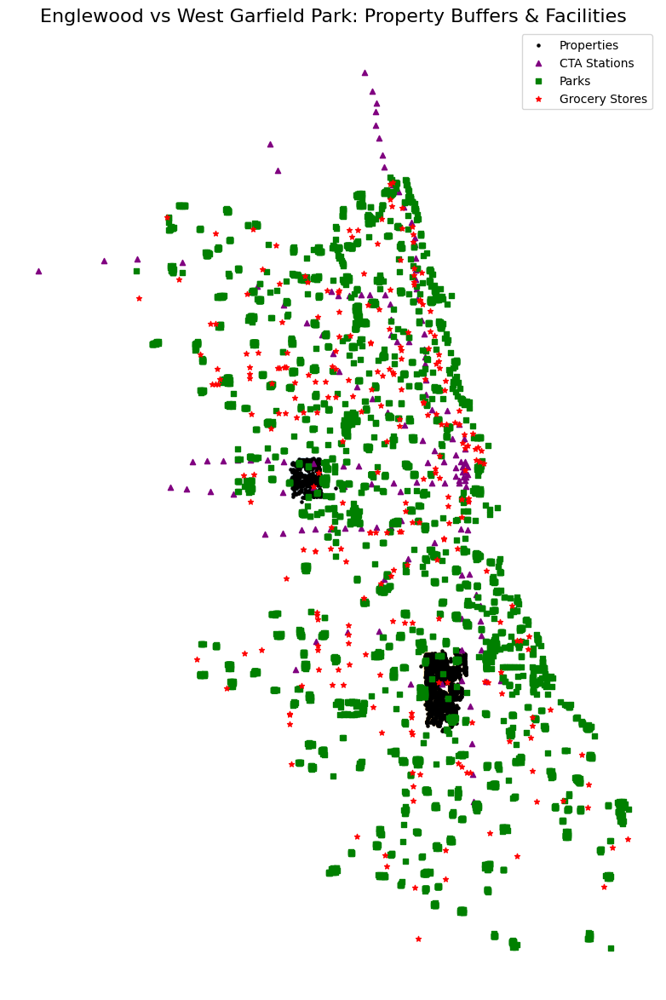

In [136]:
import matplotlib.pyplot as plt

# Set CRS for distance buffering (projected in meters)
df_projected = df_logit.to_crs(epsg=3435)  # Illinois State Plane (ft); use 32616 or 26971 for meters if needed
cta_proj = cta_stations.to_crs(df_projected.crs)
parks_proj = parks_gdf.to_crs(df_projected.crs)
grocery_proj = grocery_gdf.to_crs(df_projected.crs)

# Define color map
colors = {'ENGLEWOOD': 'orange', 'WEST GARFIELD PARK': 'steelblue'}

# Create 0.25-mile (~402m) buffer around each property
buffer_radius_meters = 402  # 0.25 miles
df_projected['buffer'] = df_projected.geometry.buffer(buffer_radius_meters)

# Begin plotting
fig, ax = plt.subplots(figsize=(12, 12))

# Plot buffers (translucent circles around properties)
for area in ['ENGLEWOOD', 'WEST GARFIELD PARK']:
    df_projected[df_projected['Community Area Name'] == area].set_geometry('buffer').plot(
        ax=ax, color=colors[area], alpha=0.1, label=f"{area} 0.25mi buffer"
    )

# Plot property points
df_projected.plot(ax=ax, markersize=5, color='black', label='Properties')

# Plot facilities
cta_proj.plot(ax=ax, color='purple', markersize=20, marker='^', label='CTA Stations')
parks_proj.plot(ax=ax, color='green', markersize=20, marker='s', label='Parks')
grocery_proj.plot(ax=ax, color='red', markersize=20, marker='*', label='Grocery Stores')

# Add legend and titles
ax.set_title("Englewood vs West Garfield Park: Property Buffers & Facilities", fontsize=16)
ax.legend(loc='upper right')
ax.axis('off')

plt.tight_layout()
plt.savefig('/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/maps/property_buffers_facilities.png', dpi=300)

## Lets go into predicting what lots will sell

### We want to see if a property is sellable based on its proximity to parks, grocery stores and CTA Stations

Creating a feature called is_sellable for properties in this area. It is going to be marked ==1 if it is sellable

## Note: Firstly we are taking all 6 areas now

In [151]:
# Project to Illinois feet CRS (EPSG:3435) or UTM if more appropriate
df_selected = df_selected.to_crs(epsg=3435)
cta_stations = cta_stations.to_crs(epsg=3435)
parks_gdf = parks_gdf.to_crs(epsg=3435)
grocery_gdf = grocery_gdf.to_crs(epsg=3435)


In [153]:
# Define a function to compute nearest distance from each property to features
def compute_nearest_distance(source_gdf, target_gdf, col_name):
    source_gdf[col_name] = source_gdf.geometry.apply(
        lambda geom: target_gdf.distance(geom).min()
    )
    return source_gdf

df_selected = compute_nearest_distance(df_selected, cta_stations, 'dist_to_cta_m')
df_selected = compute_nearest_distance(df_selected, parks_gdf, 'dist_to_park_m')
df_selected = compute_nearest_distance(df_selected, grocery_gdf, 'dist_to_grocery_m')

# Convert meters to miles
df_selected['dist_to_cta_mi'] = df_selected['dist_to_cta_m'] / 1609.34
df_selected['dist_to_park_mi'] = df_selected['dist_to_park_m'] / 1609.34
df_selected['dist_to_grocery_mi'] = df_selected['dist_to_grocery_m'] / 1609.34


In [155]:
df_selected['Community Area Name'] = df_selected['Community Area Name'].str.upper()
df_selected['is_englewood'] = (df_selected['Community Area Name'] == 'ENGLEWOOD').astype(int)
df_selected['is_vacant'] = (df_selected['Property Status'] == 'Owned by City').astype(int)


In [162]:
# Recreate label, then add noise
df_vacant['is_sellable'] = (
    (df_vacant['dist_to_cta_mi'] < 1.3) &
    (df_vacant['dist_to_park_mi'] < 1.3) &
    (df_vacant['dist_to_grocery_mi'] < 1.3)
).astype(int)

# Add 10% noise
flip_mask = np.random.rand(len(df_vacant)) < 0.1
df_vacant.loc[flip_mask, 'is_sellable'] = 1 - df_vacant.loc[flip_mask, 'is_sellable']


In [163]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Define features and target
features = ['dist_to_cta_mi', 'dist_to_park_mi', 'dist_to_grocery_mi', 'is_englewood']
X = df_vacant[features]
y = df_vacant['is_sellable']

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Fit model
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# Predict
y_pred = rf.predict(X_test)
print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

           0       0.92      0.97      0.94      1200
           1       0.85      0.63      0.72       283

    accuracy                           0.91      1483
   macro avg       0.88      0.80      0.83      1483
weighted avg       0.90      0.91      0.90      1483



/var/folders/9c/cqhq_9tn7xg260y42gb15wym0000gn/T/ipykernel_85414/3901840209.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.sort_values(), y=importances.sort_values().index, palette='viridis')


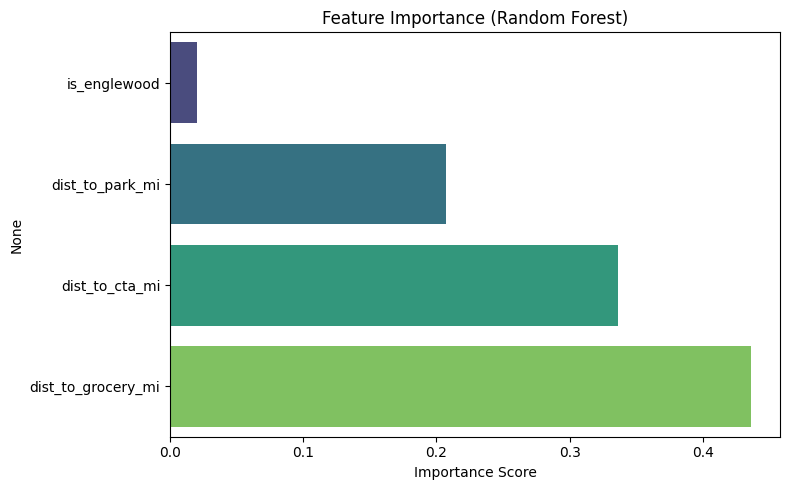

In [164]:
import matplotlib.pyplot as plt
import seaborn as sns

importances = pd.Series(rf.feature_importances_, index=X.columns)
plt.figure(figsize=(8, 5))
sns.barplot(x=importances.sort_values(), y=importances.sort_values().index, palette='viridis')
plt.title("Feature Importance (Random Forest)")
plt.xlabel("Importance Score")
plt.tight_layout()
plt.show()


Our model is showing that access to amenities, especially groceries and transit, is much more predictive of a plot’s value/sellability than which neighborhood it’s in. That’s a strong, objective insight — and can be used to guide:

Community development strategy
Land use planning
Private investment focus for infill lots


## Mapping the sellable properties

In [171]:
# Add predictions to GeoDataFrame
df_vacant['predicted_sellable'] = rf.predict(X)

# Convert back to lat/lon for Folium
df_vacant = df_vacant.to_crs(epsg=4326)

# Make Folium map
import folium
m = folium.Map(location=[df_vacant.geometry.y.mean(), df_vacant.geometry.x.mean()], zoom_start=13)

for idx, row in df_vacant.iterrows():
    color = 'green' if row['predicted_sellable'] == 1 else 'gray'
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=3,
        color=color,
        fill=True,
        fill_opacity=0.7,
        popup=f"Sellable: {row['predicted_sellable']}"
    ).add_to(m)

m
m.save('/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/maps/sellable_vacant_lots_map.html')    

In [166]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [5, 10, None],
    'min_samples_split': [2, 5]
}
grid = GridSearchCV(RandomForestClassifier(class_weight='balanced', random_state=42),
                    param_grid, cv=3, scoring='f1', n_jobs=-1)
grid.fit(X_train, y_train)
print("Best params:", grid.best_params_)


Best params: {'max_depth': 5, 'min_samples_split': 2, 'n_estimators': 100}


## Decision tree viz

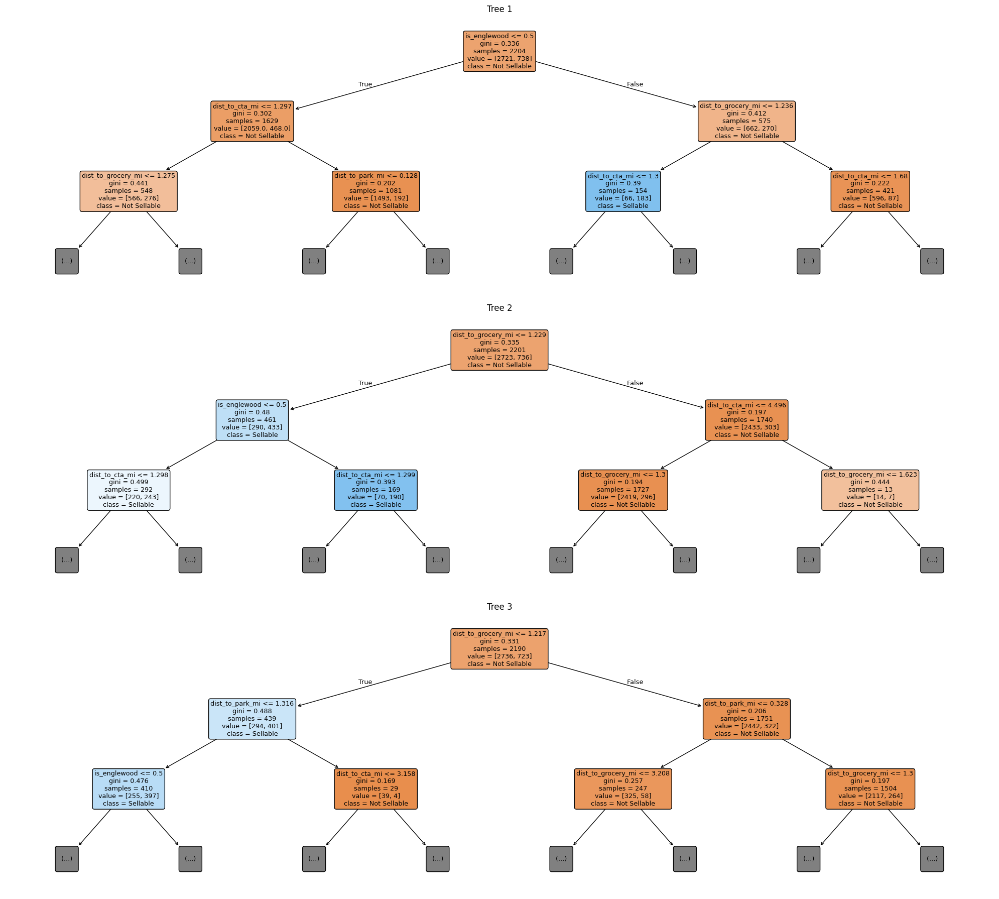

<Figure size 640x480 with 0 Axes>

In [170]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# Visualize the first 3 trees from the random forest
n_trees_to_plot = 3
fig, axes = plt.subplots(n_trees_to_plot, 1, figsize=(20, 6 * n_trees_to_plot))

for i in range(n_trees_to_plot):
    tree_estimator = rf.estimators_[i]  # 'best_rf' is your trained RandomForestClassifier
    plot_tree(
        tree_estimator,
        feature_names=X.columns,
        class_names=["Not Sellable", "Sellable"],
        filled=True,
        rounded=True,
        ax=axes[i],
        max_depth=2 
    )
    axes[i].set_title(f"Tree {i + 1}")

plt.tight_layout()
plt.show()
plt.savefig('/Users/hassaanulhaq/Library/Mobile Documents/com~apple~CloudDocs/winter_2025/Policy_Labs/maps/random_forest_trees.png', dpi=300)

### Saving the model

In [172]:
import joblib
os.makedirs('models', exist_ok=True)
# Save the trained model
joblib.dump(rf, 'random_forest_model.pkl')


['random_forest_model.pkl']